# Artificial Neural Networks and Deep Learning

---

## Homework 2: Minimal Working Example

To make your first submission, follow these steps:
1. Create a folder named `[2024-2025] AN2DL/Homework 2` in your Google Drive.
2. Upload the `mars_for_students.npz` file to this folder.
3. Upload the Jupyter notebook `Homework 2 - Minimal Working Example.ipynb`.
4. Load and process the data.
5. Implement and train your model.
6. Submit the generated `.csv` file to Kaggle.


## 🌐 Connect Colab to Google Drive

In [2]:
from google.colab import drive

drive.mount("/gdrive")
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 2

Mounted at /gdrive
/gdrive/My Drive/[2024-2025] AN2DL/Homework 2


## ⚙️ Import Libraries

In [3]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.17.1
Keras version: 3.5.0
GPU devices: 1


## ⏳ Load the Data

In [4]:
data = np.load("mars_for_students.npz")

training_set = data["training_set"]
X_train = training_set[:, 0]
y_train = training_set[:, 1]

X_test = data["test_set"]

print(f"Training X shape: {X_train.shape}")
print(f"Training y shape: {y_train.shape}")
print(f"Test X shape: {X_test.shape}")

Training X shape: (2615, 64, 128)
Training y shape: (2615, 64, 128)
Test X shape: (10022, 64, 128)


## Analyze data


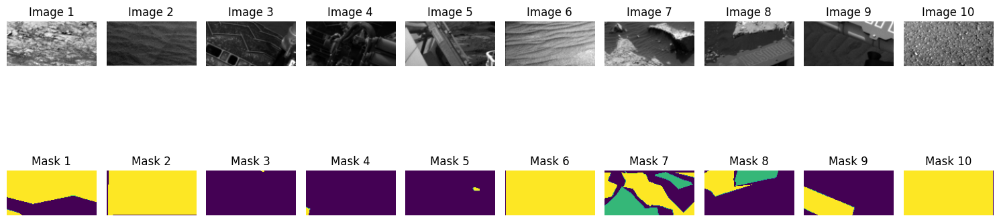

In [5]:
# Visualize the data
# Reshape to 2D for visualization
X_train_images = np.array([x.reshape(64, 128) for x in X_train])
y_train_masks = np.array([y.reshape(64, 128) for y in y_train])

# Plot the first 5 images and their corresponding masks
fig, axes = plt.subplots(2, 10, figsize=(15, 6))
for i in range(10):
    # Input images
    axes[0, i].imshow(X_train_images[i], cmap="gray")
    axes[0, i].set_title(f"Image {i+1}")
    axes[0, i].axis("off")

    # Masks
    axes[1, i].imshow(y_train_masks[i], cmap="viridis")
    axes[1, i].set_title(f"Mask {i+1}")
    axes[1, i].axis("off")
plt.tight_layout()
plt.show()

## Class Imbalance

In [6]:
# Define class labels as a dictionary
class_labels = {
    0: "Background",
    1: "Soil",
    2: "Bedrock",
    3: "Sand",
    4: "Big Rock"
}


Class Distribution in Masks (Filtered Dataset):
Class 0.0 (Background): 5466886 pixels
Class 1.0 (Soil): 7131118 pixels
Class 2.0 (Bedrock): 4863930 pixels
Class 3.0 (Sand): 3933183 pixels
Class 4.0 (Big Rock): 26963 pixels


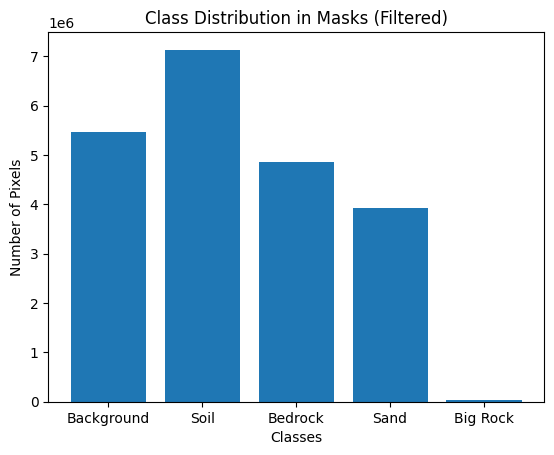

In [7]:
# Count the number of pixels per class
unique, counts = np.unique(y_train, return_counts=True)
class_distribution = dict(zip(unique, counts))

# Print class distribution
print("Class Distribution in Masks (Filtered Dataset):")
for class_id, count in class_distribution.items():
    print(f"Class {class_id} ({class_labels[class_id]}): {count} pixels")

# Visualize class distribution
plt.bar(class_distribution.keys(), class_distribution.values(), tick_label=[class_labels[c] for c in class_distribution.keys()])
plt.title("Class Distribution in Masks (Filtered)")
plt.xlabel("Classes")
plt.ylabel("Number of Pixels")
plt.show()


In [8]:
total_pixels = np.prod(y_train_masks.shape)
class_percentages = {class_labels[c]: (count / total_pixels) * 100 for c, count in class_distribution.items()}
print("Class Percentages:")
for label, percent in class_percentages.items():
    print(f"{label}: {percent:.2f}%")


Class Percentages:
Background: 25.52%
Soil: 33.29%
Bedrock: 22.71%
Sand: 18.36%
Big Rock: 0.13%


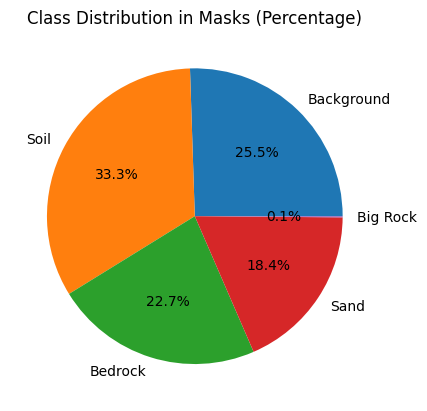

In [9]:
plt.pie(class_distribution.values(), labels=[class_labels[c] for c in class_distribution.keys()], autopct='%1.1f%%')
plt.title("Class Distribution in Masks (Percentage)")
plt.show()


In [10]:
# Identify empty masks
empty_mask_indices = [i for i, mask in enumerate(y_train_masks) if np.all(mask == 0)]
print(f"Number of empty masks: {len(empty_mask_indices)}")

# Check for masks with only one class
single_class_masks = [i for i, mask in enumerate(y_train_masks) if len(np.unique(mask)) == 1]
print(f"Number of masks with a single class: {len(single_class_masks)}")


Number of empty masks: 7
Number of masks with a single class: 425


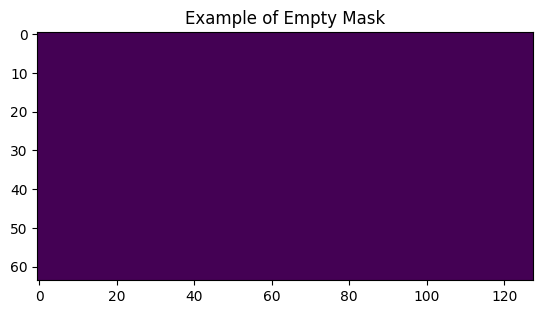

In [11]:

if empty_mask_indices:
    plt.imshow(y_train_masks[empty_mask_indices[0]], cmap="viridis")
    plt.title("Example of Empty Mask")
    plt.show()


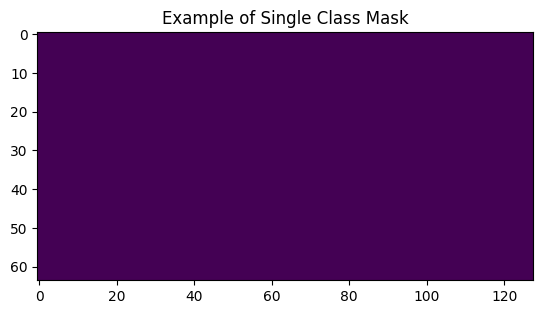

In [12]:

if single_class_masks:
    plt.imshow(y_train_masks[single_class_masks[20]], cmap="viridis")
    plt.title("Example of Single Class Mask")
    plt.show()


## Outliers

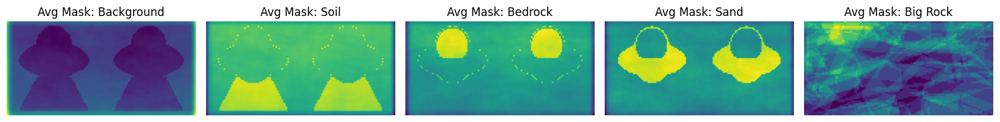

In [13]:
avg_masks = {}
for class_id in class_labels.keys():
    avg_masks[class_id] = np.mean((y_train_masks == class_id), axis=0)

# Plot average masks
fig, axes = plt.subplots(1, len(class_labels), figsize=(15, 4))
for class_id, ax in zip(class_labels.keys(), axes):
    ax.imshow(avg_masks[class_id], cmap="viridis")
    ax.set_title(f"Avg Mask: {class_labels[class_id]}")
    ax.axis("off")
plt.tight_layout()
plt.show()


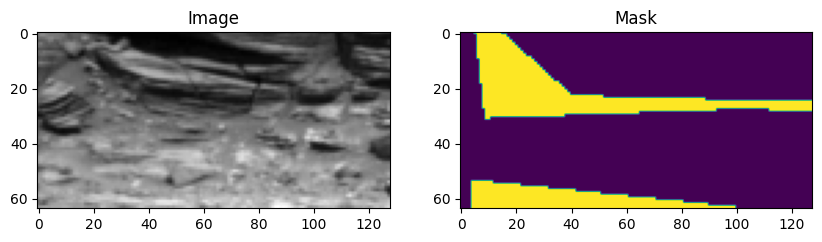

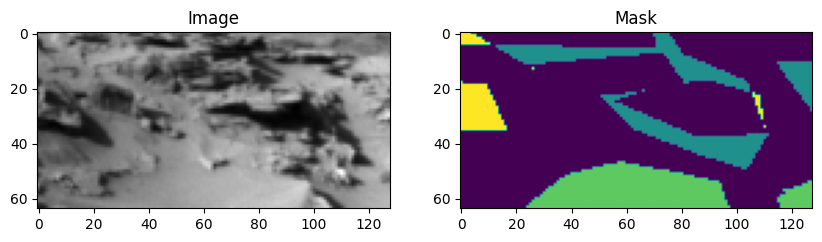

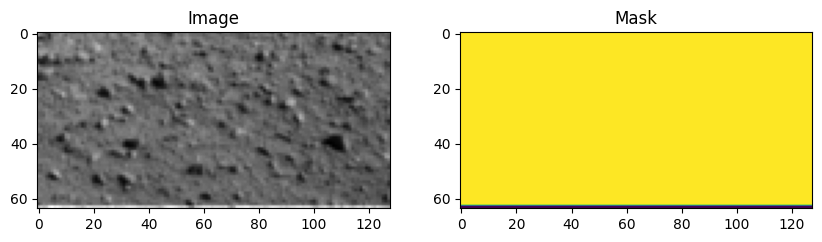

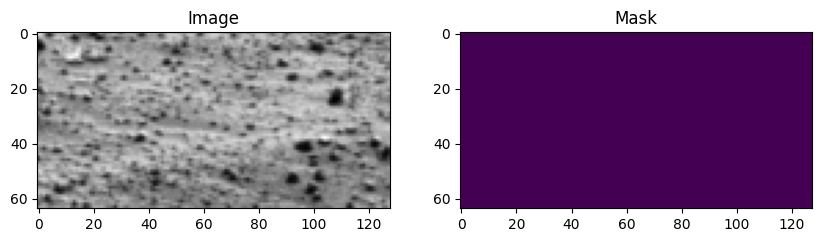

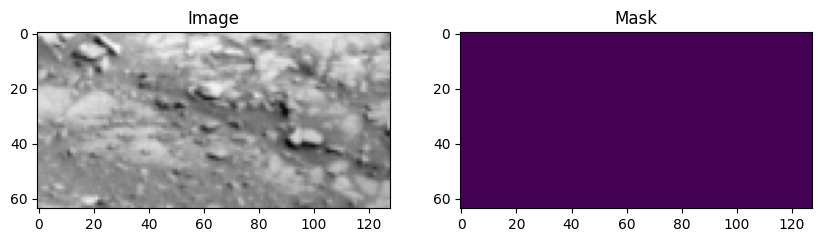

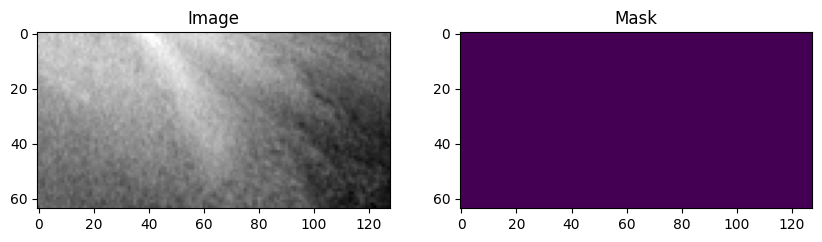

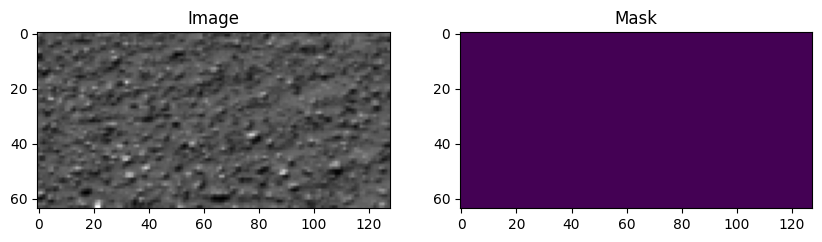

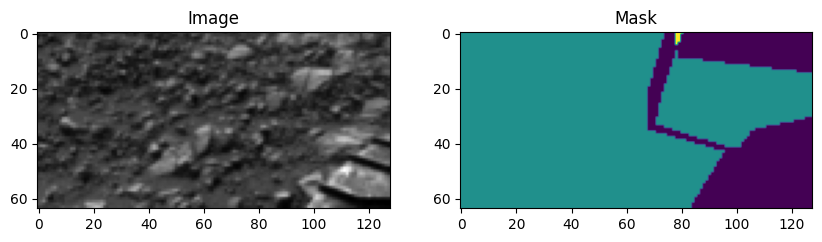

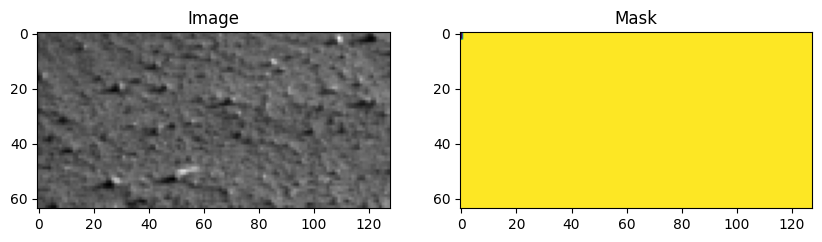

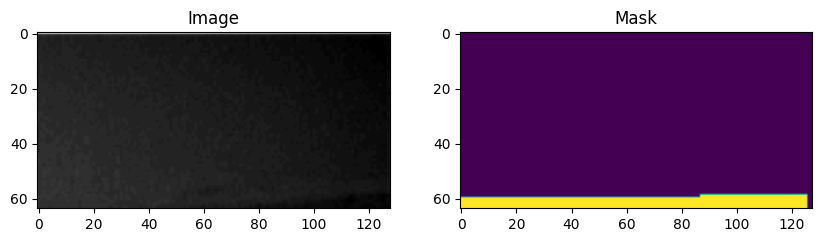

In [14]:
import random

# Randomly sample a few image-mask pairs
for _ in range(10):
    idx = random.randint(0, len(X_train_images) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(X_train_images[idx], cmap="gray")
    ax[0].set_title("Image")
    ax[1].imshow(y_train_masks[idx], cmap="viridis")
    ax[1].set_title("Mask")
    plt.show()


In [15]:
import numpy as np

# Calculate mean and standard deviation of pixel intensities for each image
image_features = np.array([[np.mean(img), np.std(img)] for img in X_train])

print(f"Feature shape: {image_features.shape}")


Feature shape: (2615, 2)


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


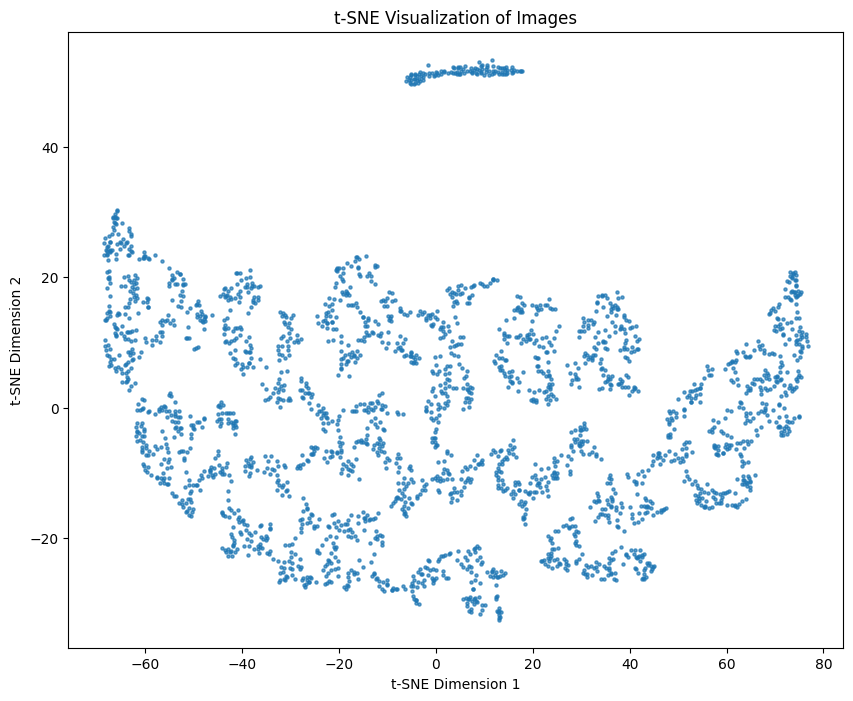

In [16]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Apply t-SNE to the features
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
image_tsne = tsne.fit_transform(image_features)

# Plot the t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(image_tsne[:, 0], image_tsne[:, 1], s=5, alpha=0.7)
plt.title("t-SNE Visualization of Images")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


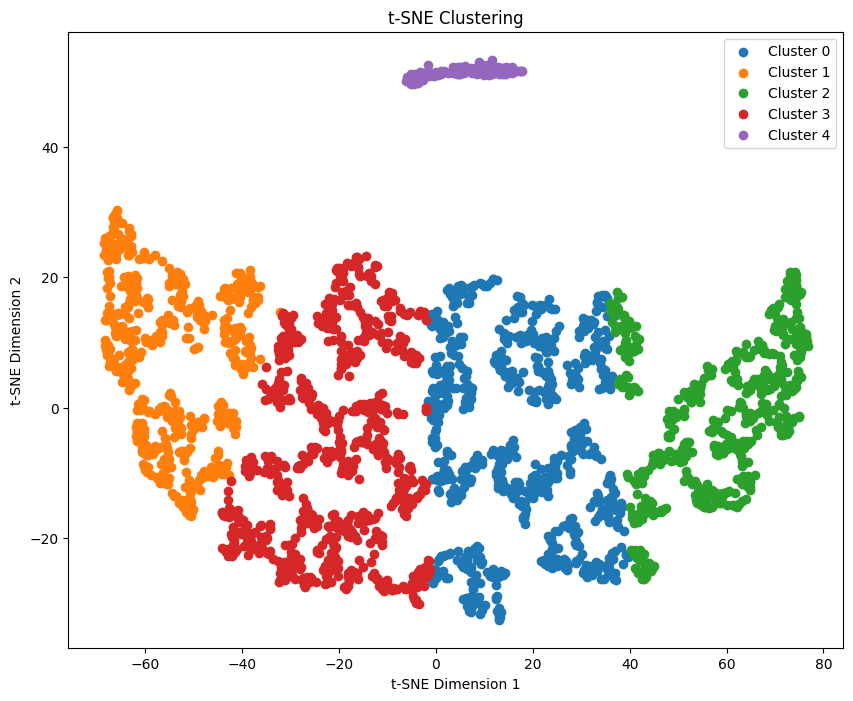

In [17]:
from sklearn.cluster import KMeans

# Apply k-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters as needed
labels = kmeans.fit_predict(image_tsne)

# Visualize clusters
plt.figure(figsize=(10, 8))
for cluster in np.unique(labels):
    plt.scatter(image_tsne[labels == cluster, 0], image_tsne[labels == cluster, 1], label=f"Cluster {cluster}")
plt.legend()
plt.title("t-SNE Clustering")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


Number of images in Cluster 4: 110


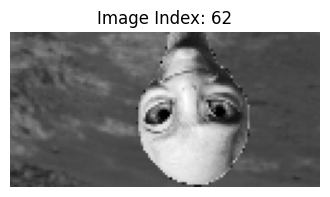

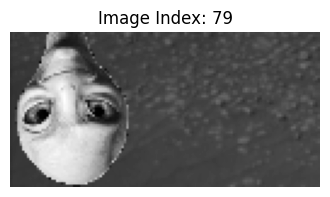

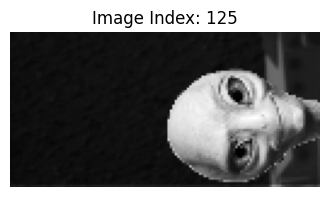

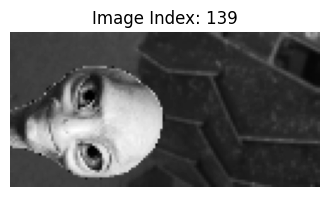

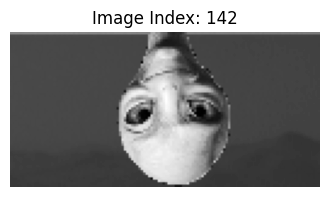

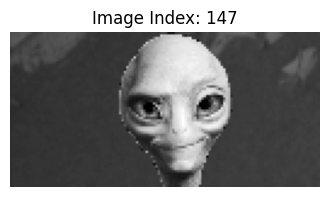

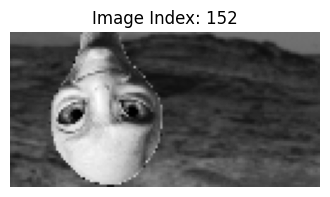

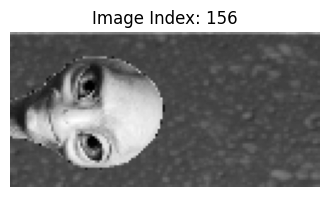

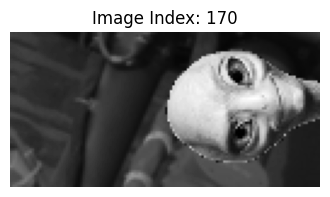

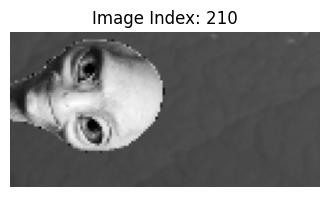

In [18]:
import matplotlib.pyplot as plt

# Assuming `labels` contains the cluster assignments from k-means or another clustering method
# Find indices of images in Cluster 4 (purple cluster)
cluster_4_indices = [i for i, label in enumerate(labels) if label == 4]

print(f"Number of images in Cluster 4: {len(cluster_4_indices)}")

# Visualize images in Cluster 4
for idx in cluster_4_indices[:10]:  # Show the first 10 images in the cluster
    plt.figure(figsize=(4, 4))
    plt.imshow(X_train[idx].squeeze(), cmap="gray")
    plt.title(f"Image Index: {idx}")
    plt.axis("off")
    plt.show()


In [19]:
import os
from PIL import Image

# Create a directory to save images
os.makedirs("cluster_4_images", exist_ok=True)

# Save images in Cluster 4
for idx in cluster_4_indices:
    image = X_train[idx].squeeze()
    Image.fromarray((image * 255).astype(np.uint8)).save(f"cluster_4_images/image_{idx}.png")


### Outliers removed

In [20]:
# Remove Cluster 4 indices from X_train_filtered and y_train_filtered
import numpy as np

# Find indices of images in Cluster 4 (purple cluster)
cluster_4_indices = [i for i, label in enumerate(labels) if label == 4]

print(f"Number of images in Cluster 4: {len(cluster_4_indices)}")

# Create filtered datasets by excluding Cluster 4 indices
X_train_filtered = np.delete(X_train, cluster_4_indices, axis=0)
y_train_filtered = np.delete(y_train, cluster_4_indices, axis=0)

print(f"Updated dataset size: {X_train_filtered.shape[0]} images, {y_train_filtered.shape[0]} masks")


Number of images in Cluster 4: 110
Updated dataset size: 2505 images, 2505 masks


In [21]:
X_train_images = np.array([x.reshape(64, 128) for x in X_train_filtered])
y_train_masks = np.array([y.reshape(64, 128) for y in y_train_filtered])

## Analysis without the outliers

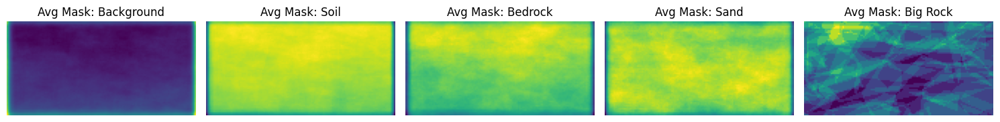

In [22]:
avg_masks = {}
for class_id in class_labels.keys():
    avg_masks[class_id] = np.mean((y_train_masks == class_id), axis=0)

# Plot average masks
fig, axes = plt.subplots(1, len(class_labels), figsize=(15, 4))
for class_id, ax in zip(class_labels.keys(), axes):
    ax.imshow(avg_masks[class_id], cmap="viridis")
    ax.set_title(f"Avg Mask: {class_labels[class_id]}")
    ax.axis("off")
plt.tight_layout()
plt.show()


CLASS IMBALANCE

Class Distribution in Masks (Filtered Dataset):
Class 0.0 (Background): 4988826 pixels
Class 1.0 (Soil): 6957538 pixels
Class 2.0 (Bedrock): 4776810 pixels
Class 3.0 (Sand): 3770823 pixels
Class 4.0 (Big Rock): 26963 pixels


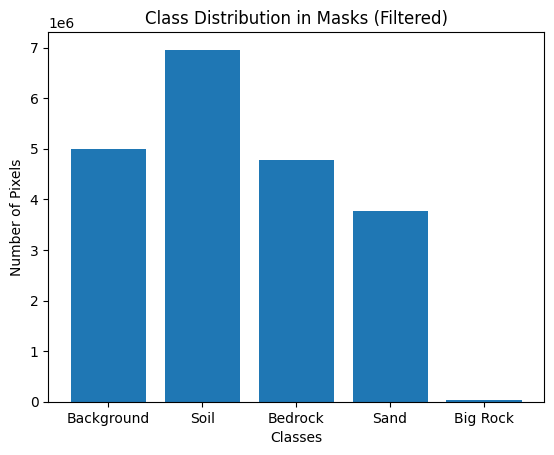

In [23]:
# Count the number of pixels per class
unique, counts = np.unique(y_train_filtered, return_counts=True)
class_distribution = dict(zip(unique, counts))

# Print class distribution
print("Class Distribution in Masks (Filtered Dataset):")
for class_id, count in class_distribution.items():
    print(f"Class {class_id} ({class_labels[class_id]}): {count} pixels")

# Visualize class distribution
plt.bar(class_distribution.keys(), class_distribution.values(), tick_label=[class_labels[c] for c in class_distribution.keys()])
plt.title("Class Distribution in Masks (Filtered)")
plt.xlabel("Classes")
plt.ylabel("Number of Pixels")
plt.show()


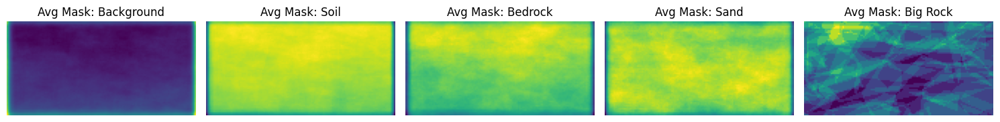

In [24]:
# Compute average mask for each class
avg_masks = {}
for class_id in class_labels.keys():
    avg_masks[class_id] = np.mean((y_train_filtered == class_id), axis=0)

# Visualize average masks
fig, axes = plt.subplots(1, len(class_labels), figsize=(15, 4))
for class_id, ax in zip(class_labels.keys(), axes):
    ax.imshow(avg_masks[class_id], cmap="viridis")
    ax.set_title(f"Avg Mask: {class_labels[class_id]}")
    ax.axis("off")
plt.tight_layout()
plt.show()


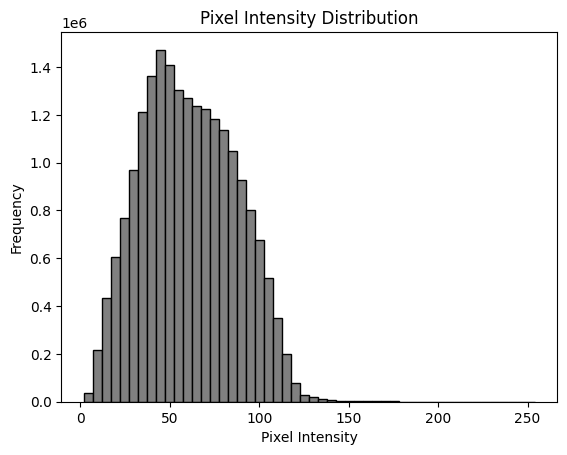

In [25]:
# Flatten all images to a 1D array
pixel_values = X_train_filtered.flatten()

# Plot histogram of pixel intensities
plt.hist(pixel_values, bins=50, color="gray", edgecolor="black")
plt.title("Pixel Intensity Distribution")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()


In [26]:
# Identify indices of images containing Big Rock (class 4)
big_rock_indices = [i for i, mask in enumerate(y_train_filtered) if 4 in mask]

# Extract images and masks containing Big Rock
X_big_rock = X_train_filtered[big_rock_indices]
y_big_rock = y_train_filtered[big_rock_indices]

print(f"Number of Big Rock images: {len(X_big_rock)}")


Number of Big Rock images: 63


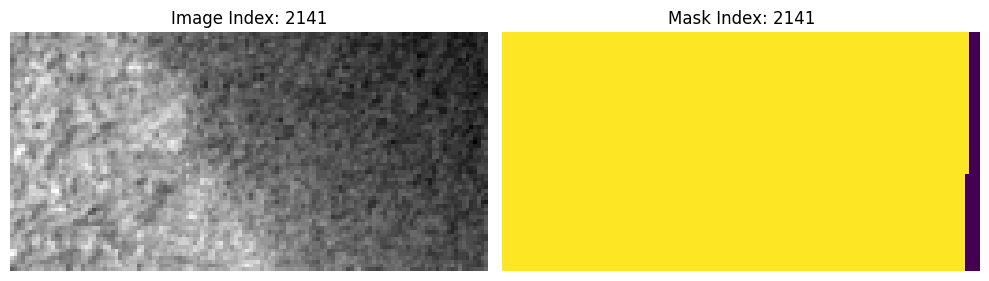

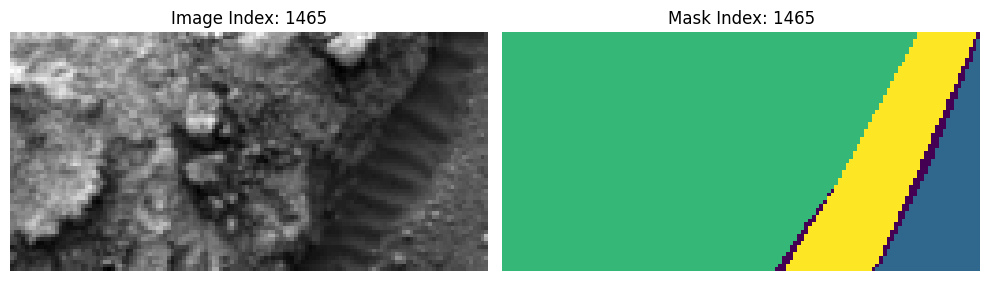

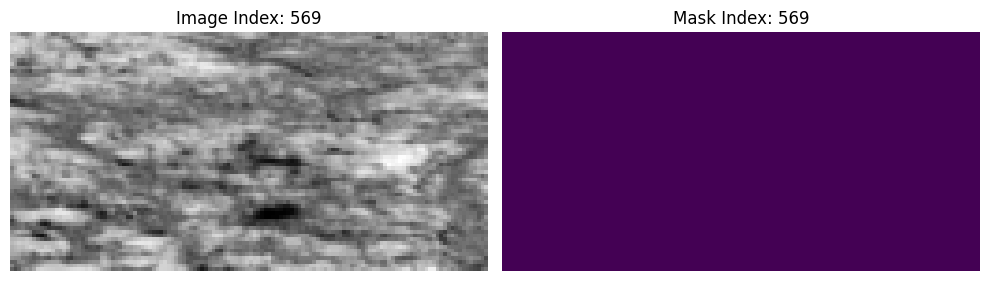

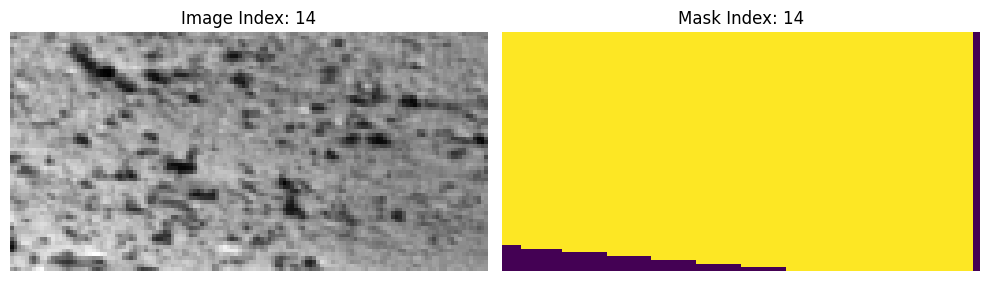

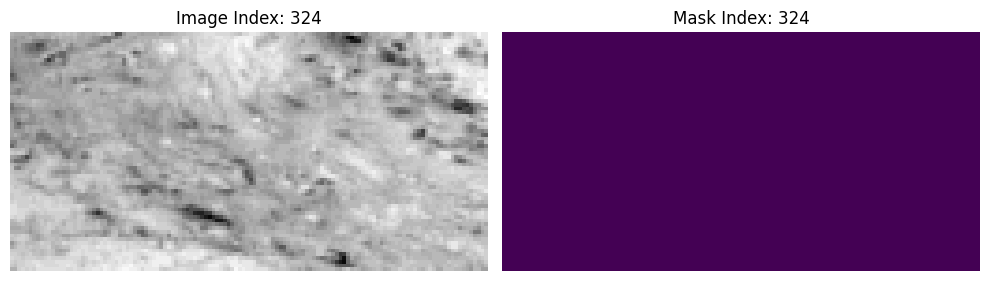

In [27]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train_filtered) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train_filtered[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train_filtered[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


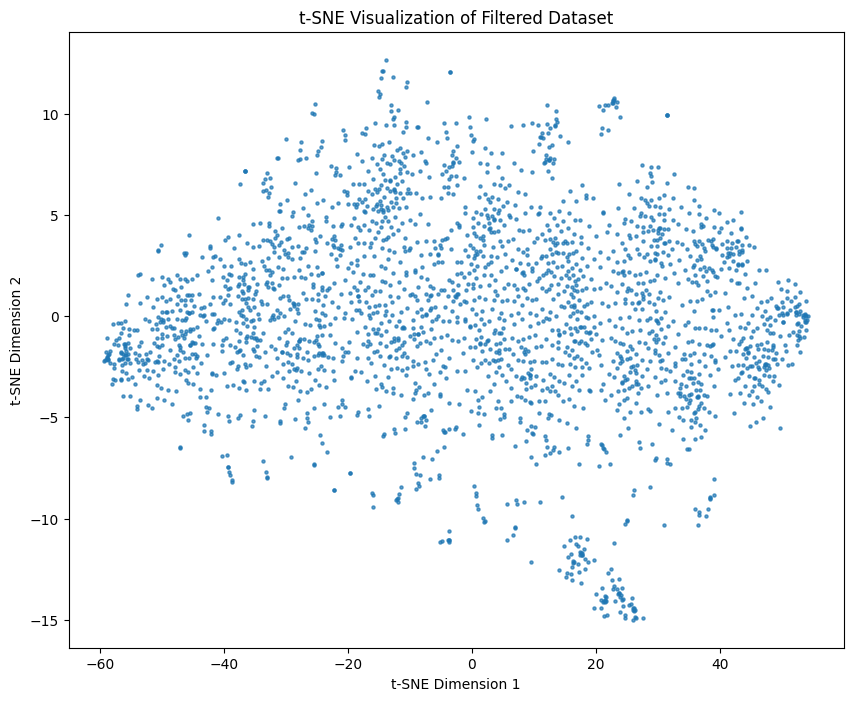

In [28]:
from sklearn.manifold import TSNE

# Flatten images for t-SNE
X_flattened = X_train_filtered.reshape(X_train_filtered.shape[0], -1)

# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(X_flattened)

# Plot t-SNE results
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=5, alpha=0.7)
plt.title("t-SNE Visualization of Filtered Dataset")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


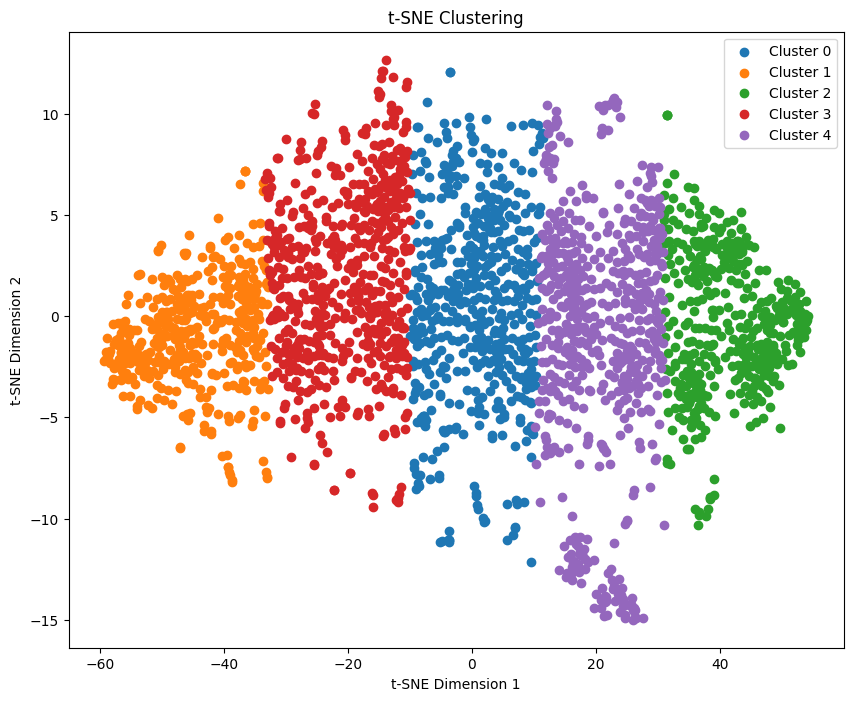

In [29]:
from sklearn.cluster import KMeans

# Apply k-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Adjust the number of clusters as needed
labels = kmeans.fit_predict(X_tsne)

# Visualize clusters
plt.figure(figsize=(10, 8))
for cluster in np.unique(labels):
    plt.scatter(X_tsne[labels == cluster, 0], X_tsne[labels == cluster, 1], label=f"Cluster {cluster}")
plt.legend()
plt.title("t-SNE Clustering")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()


In [30]:
X_train=X_train_filtered
y_train=y_train_filtered

## 🛠️ Train and Save the Model

In [31]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [32]:
X_train[234]

array([[[0.31372549],
        [0.30980392],
        [0.30588235],
        ...,
        [0.28235294],
        [0.28235294],
        [0.29019608]],

       [[0.32156863],
        [0.31372549],
        [0.30980392],
        ...,
        [0.29019608],
        [0.28627451],
        [0.29411765]],

       [[0.32156863],
        [0.32156863],
        [0.31372549],
        ...,
        [0.29803922],
        [0.28235294],
        [0.28627451]],

       ...,

       [[0.43137255],
        [0.43529412],
        [0.43529412],
        ...,
        [0.31372549],
        [0.30980392],
        [0.33333333]],

       [[0.40392157],
        [0.41176471],
        [0.42352941],
        ...,
        [0.30588235],
        [0.34117647],
        [0.34117647]],

       [[0.33333333],
        [0.34117647],
        [0.36862745],
        ...,
        [0.30588235],
        [0.34509804],
        [0.34509804]]])

In [33]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (2505, 64, 128, 1)
y_train shape: (2505, 64, 128)


In [34]:
num_classes

5

In [35]:
inputs = tfkl.Input(shape=input_shape)
x = tfkl.Conv2D(filters=num_classes, kernel_size=(1, 1), activation="softmax")(inputs)
model = tfk.Model(inputs=inputs, outputs=x, name="minimal_working_net")

# Define the MeanIoU ignoring the background class
mean_iou = tfk.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False)

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=[mean_iou])

model.summary()

Model: "minimal_working_net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 128, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 128, 5)          │              10 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10 (40.00 B)

 Trainable params: 10 (40.00 B)

 Non-trainable params: 0 (0.00 B)

In [36]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()


## Adding advanced tecnics

In [37]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")


Shape of X_train after reshaping: (2505, 64, 128, 1)
Shape of y_train after reshaping: (2505, 64, 128, 1)


Shape of X_train after reshaping: (2505, 64, 128, 1)
Shape of y_train after reshaping: (2505, 64, 128)
Class pixel counts: [4988826 6957538 4776810 3770823   26963]
Calculated class weights: [0.00528795 0.00379166 0.00552265 0.00699599 0.97840175]


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 64, 128, 1)     │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 128, 64)    │            640 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 64, 128, 64)    │         36,928 │ conv2d_22[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 32, 64, 64)     │              0 │ conv2d_23[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 32, 64, 128)    │         73,856 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 32, 64, 128)    │        147,584 │ conv2d_24[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_3        │ (None, 64, 128, 64)    │         32,832 │ conv2d_25[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 64, 128, 128)   │              0 │ conv2d_transpose_3[0]… │
│ (Concatenate)             │                        │                │ conv2d_23[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_26 (Conv2D)        │ (None, 64, 128, 64)    │         73,792 │ concatenate_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_27 (Conv2D)        │ (None, 64, 128, 64)    │         36,928 │ conv2d_26[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 64, 128, 5)     │            325 │ conv2d_27[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 402,885 (1.54 MB)

 Trainable params: 402,885 (1.54 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.1662 - loss: 0.0107 - mean_io_u_1: 0.0579
Epoch 1: val_loss improved from inf to 0.00848, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


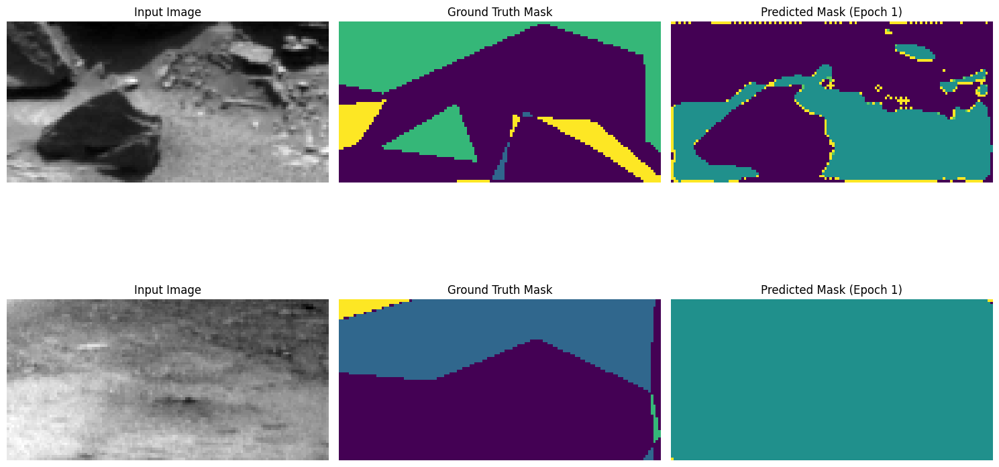

71/71 ━━━━━━━━━━━━━━━━━━━━ 17s 193ms/step - accuracy: 0.1666 - loss: 0.0107 - mean_io_u_1: 0.0580 - val_accuracy: 0.2829 - val_loss: 0.0085 - val_mean_io_u_1: 0.0655 - learning_rate: 0.0010
Epoch 2/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.2416 - loss: 0.0105 - mean_io_u_1: 0.0669
Epoch 2: val_loss improved from 0.00848 to 0.00840, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


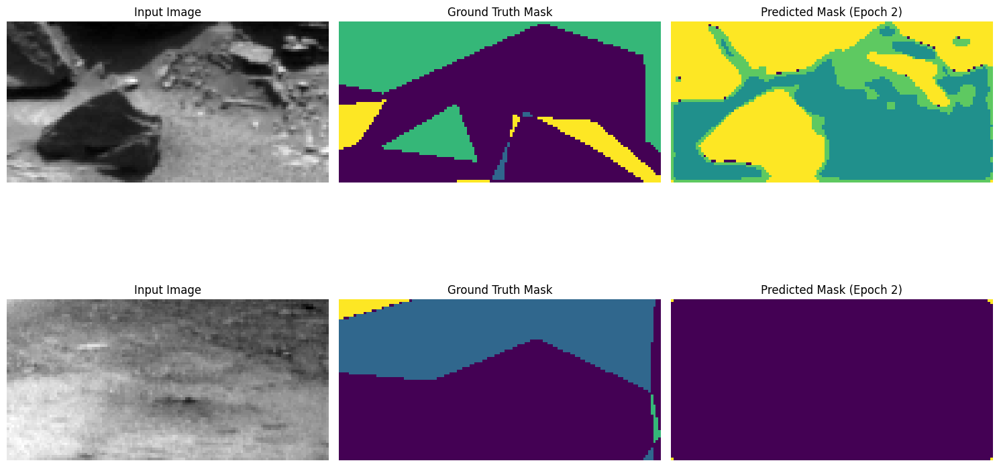

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - accuracy: 0.2410 - loss: 0.0105 - mean_io_u_1: 0.0671 - val_accuracy: 0.2339 - val_loss: 0.0084 - val_mean_io_u_1: 0.0902 - learning_rate: 0.0010
Epoch 3/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.2033 - loss: 0.0104 - mean_io_u_1: 0.0965
Epoch 3: val_loss improved from 0.00840 to 0.00839, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


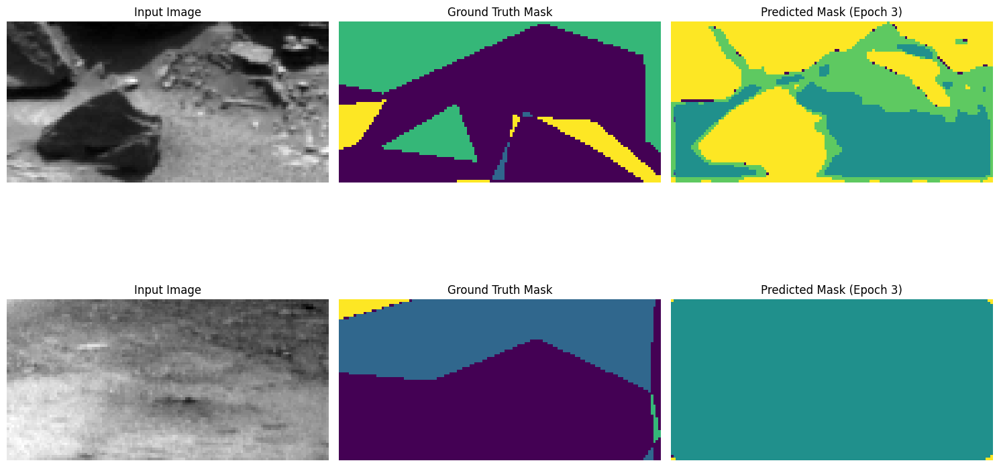

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.2037 - loss: 0.0104 - mean_io_u_1: 0.0967 - val_accuracy: 0.2415 - val_loss: 0.0084 - val_mean_io_u_1: 0.1032 - learning_rate: 0.0010
Epoch 4/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.2108 - loss: 0.0104 - mean_io_u_1: 0.1062
Epoch 4: val_loss improved from 0.00839 to 0.00839, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


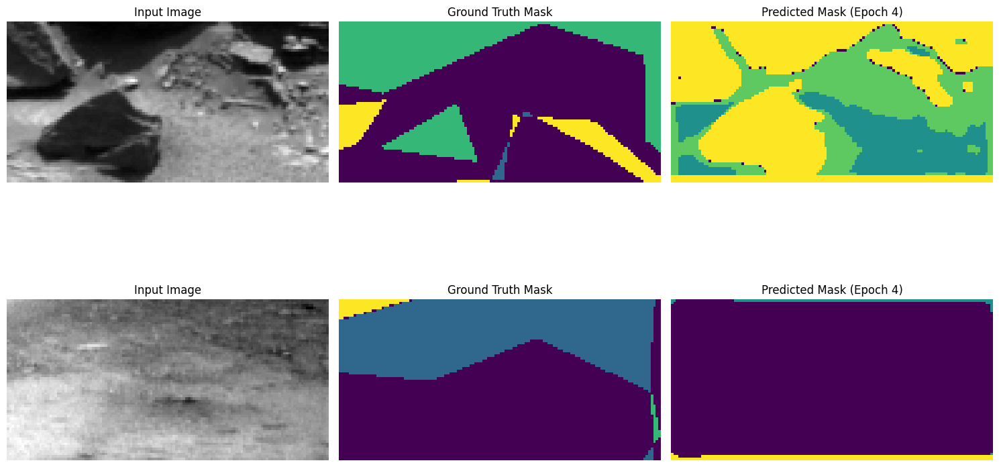

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.2111 - loss: 0.0104 - mean_io_u_1: 0.1063 - val_accuracy: 0.2459 - val_loss: 0.0084 - val_mean_io_u_1: 0.1125 - learning_rate: 0.0010
Epoch 5/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.2303 - loss: 0.0103 - mean_io_u_1: 0.1234
Epoch 5: val_loss improved from 0.00839 to 0.00837, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


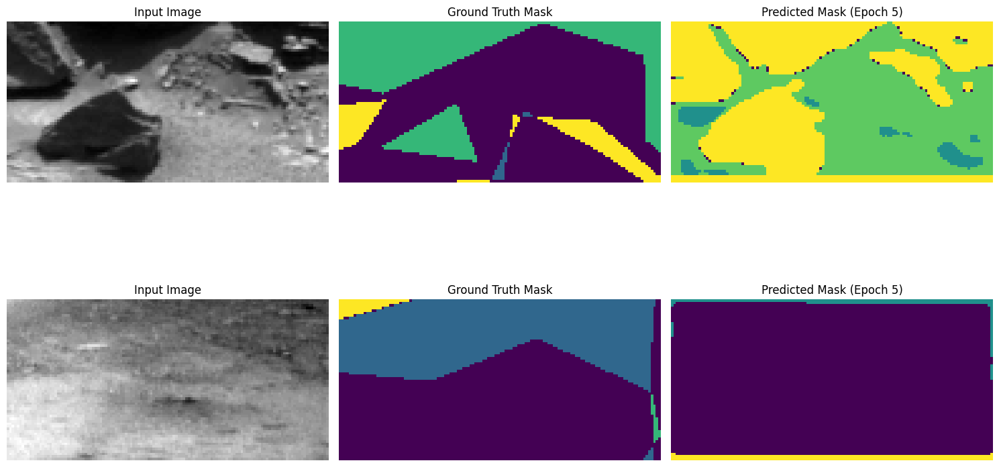

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.2305 - loss: 0.0103 - mean_io_u_1: 0.1234 - val_accuracy: 0.2464 - val_loss: 0.0084 - val_mean_io_u_1: 0.1131 - learning_rate: 0.0010
Epoch 6/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.2485 - loss: 0.0101 - mean_io_u_1: 0.1325
Epoch 6: val_loss improved from 0.00837 to 0.00826, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


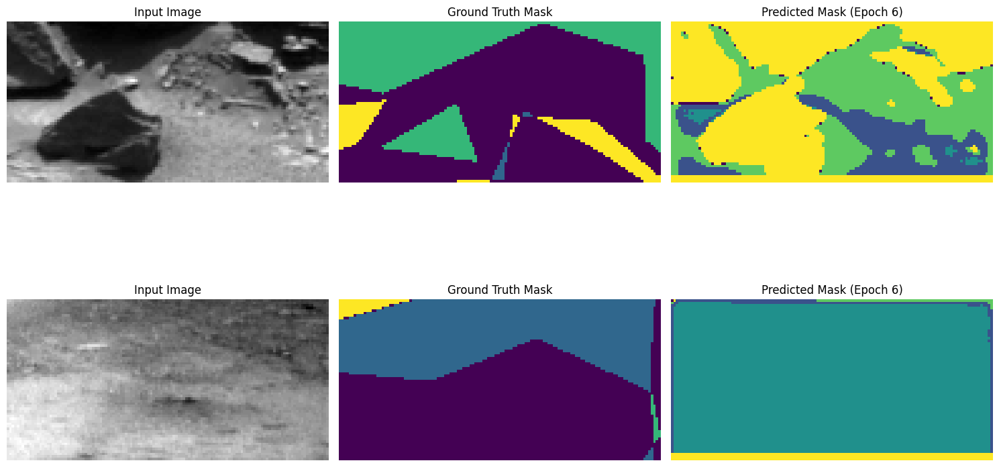

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.2486 - loss: 0.0101 - mean_io_u_1: 0.1325 - val_accuracy: 0.2692 - val_loss: 0.0083 - val_mean_io_u_1: 0.1357 - learning_rate: 0.0010
Epoch 7/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.2593 - loss: 0.0099 - mean_io_u_1: 0.1412
Epoch 7: val_loss improved from 0.00826 to 0.00821, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


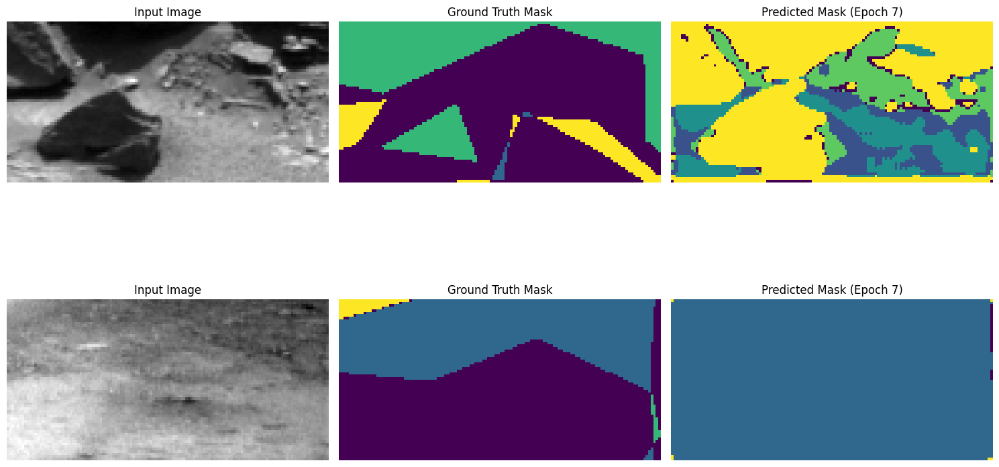

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - accuracy: 0.2595 - loss: 0.0099 - mean_io_u_1: 0.1413 - val_accuracy: 0.2746 - val_loss: 0.0082 - val_mean_io_u_1: 0.1291 - learning_rate: 0.0010
Epoch 8/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.2518 - loss: 0.0097 - mean_io_u_1: 0.1355
Epoch 8: val_loss improved from 0.00821 to 0.00787, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


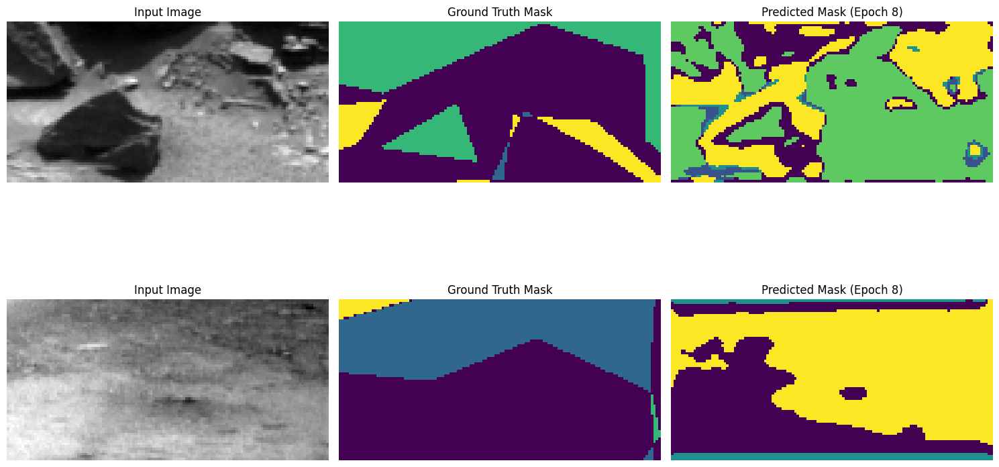

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - accuracy: 0.2525 - loss: 0.0097 - mean_io_u_1: 0.1360 - val_accuracy: 0.2999 - val_loss: 0.0079 - val_mean_io_u_1: 0.1320 - learning_rate: 0.0010
Epoch 9/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3081 - loss: 0.0091 - mean_io_u_1: 0.1637
Epoch 9: val_loss improved from 0.00787 to 0.00740, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


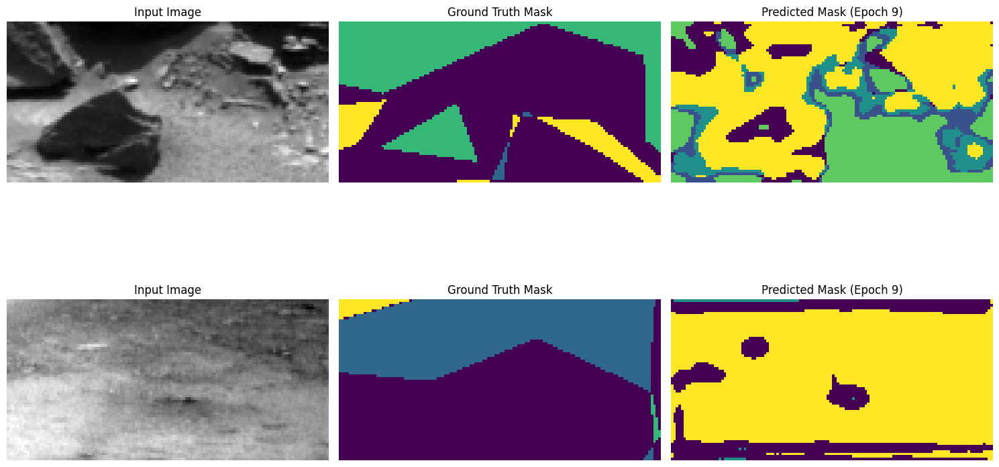

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.3084 - loss: 0.0091 - mean_io_u_1: 0.1640 - val_accuracy: 0.3649 - val_loss: 0.0074 - val_mean_io_u_1: 0.1953 - learning_rate: 0.0010
Epoch 10/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.3392 - loss: 0.0089 - mean_io_u_1: 0.1899
Epoch 10: val_loss did not improve from 0.00740
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


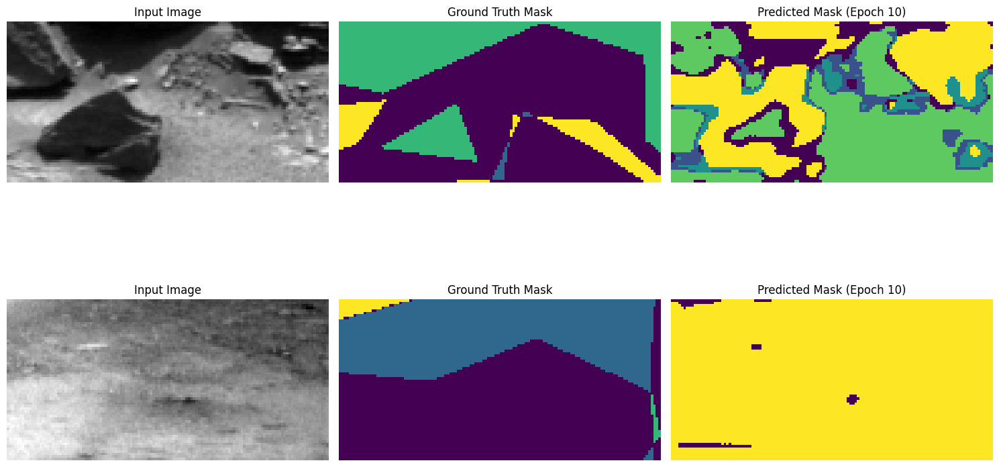

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - accuracy: 0.3390 - loss: 0.0089 - mean_io_u_1: 0.1898 - val_accuracy: 0.3145 - val_loss: 0.0077 - val_mean_io_u_1: 0.1505 - learning_rate: 0.0010
Epoch 11/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3341 - loss: 0.0087 - mean_io_u_1: 0.1865
Epoch 11: val_loss did not improve from 0.00740
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


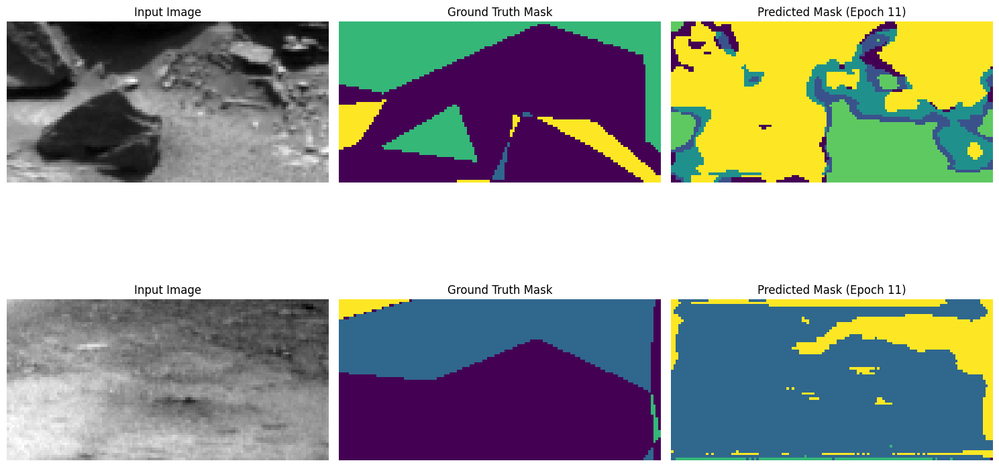

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.3343 - loss: 0.0087 - mean_io_u_1: 0.1866 - val_accuracy: 0.3618 - val_loss: 0.0075 - val_mean_io_u_1: 0.1981 - learning_rate: 0.0010
Epoch 12/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.3495 - loss: 0.0085 - mean_io_u_1: 0.2000
Epoch 12: val_loss did not improve from 0.00740
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


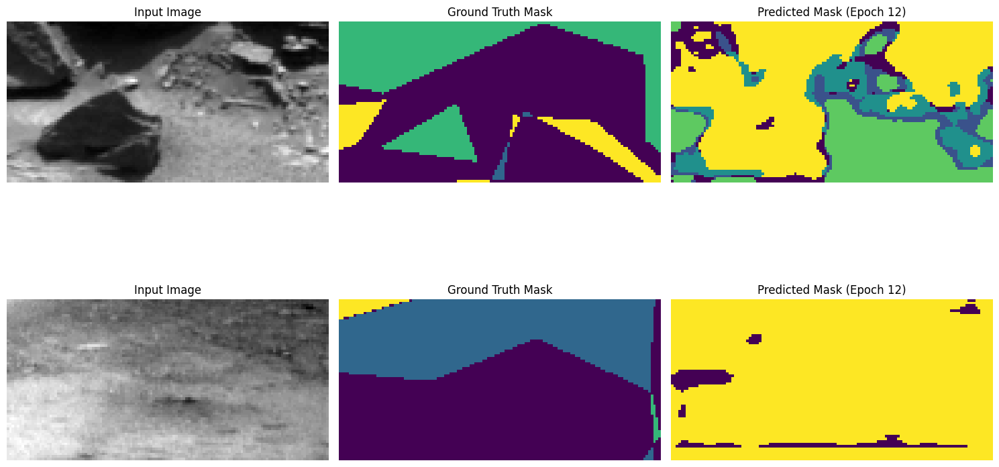

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.3496 - loss: 0.0085 - mean_io_u_1: 0.1999 - val_accuracy: 0.3361 - val_loss: 0.0075 - val_mean_io_u_1: 0.1677 - learning_rate: 0.0010
Epoch 13/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.3523 - loss: 0.0085 - mean_io_u_1: 0.1994
Epoch 13: val_loss did not improve from 0.00740
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


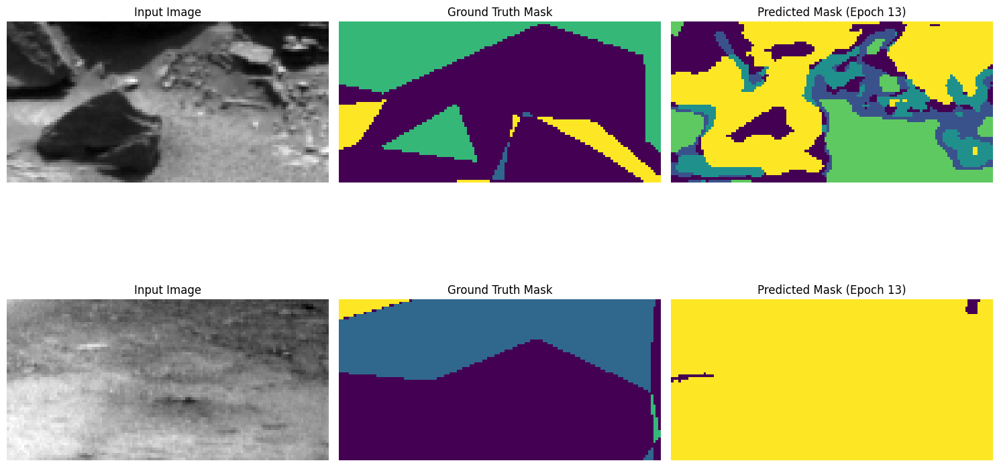

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.3525 - loss: 0.0085 - mean_io_u_1: 0.1995 - val_accuracy: 0.3354 - val_loss: 0.0075 - val_mean_io_u_1: 0.1601 - learning_rate: 0.0010
Epoch 14/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3560 - loss: 0.0085 - mean_io_u_1: 0.1984
Epoch 14: val_loss improved from 0.00740 to 0.00704, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


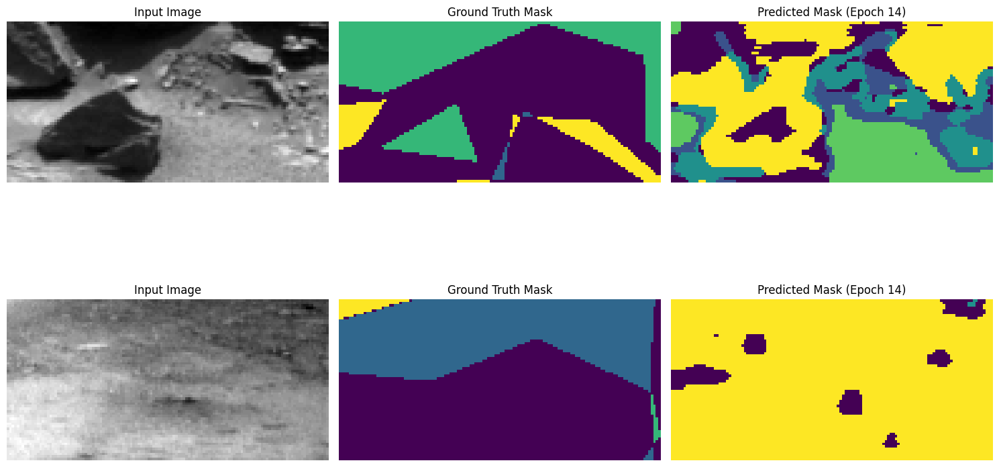

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - accuracy: 0.3562 - loss: 0.0085 - mean_io_u_1: 0.1985 - val_accuracy: 0.4021 - val_loss: 0.0070 - val_mean_io_u_1: 0.2106 - learning_rate: 0.0010
Epoch 15/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.3743 - loss: 0.0083 - mean_io_u_1: 0.2107
Epoch 15: val_loss did not improve from 0.00704
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


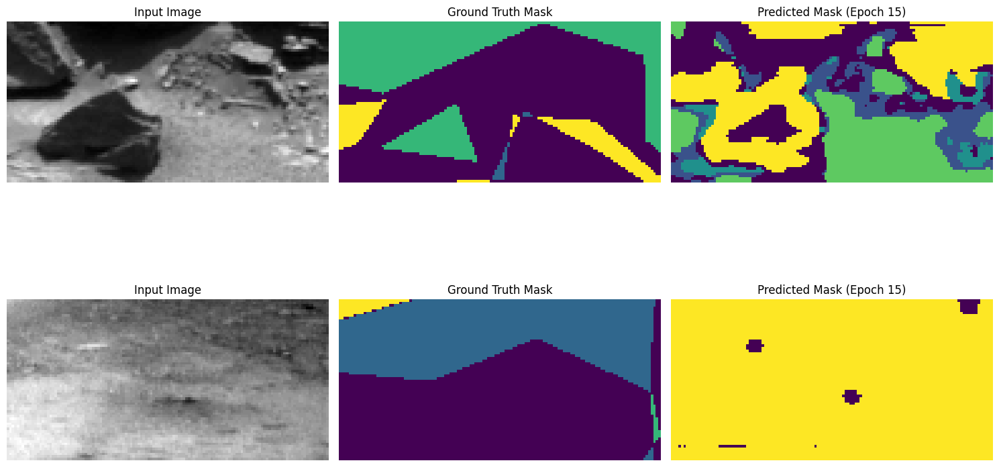

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.3742 - loss: 0.0083 - mean_io_u_1: 0.2107 - val_accuracy: 0.3733 - val_loss: 0.0072 - val_mean_io_u_1: 0.1826 - learning_rate: 0.0010
Epoch 16/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3696 - loss: 0.0083 - mean_io_u_1: 0.2042
Epoch 16: val_loss did not improve from 0.00704
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


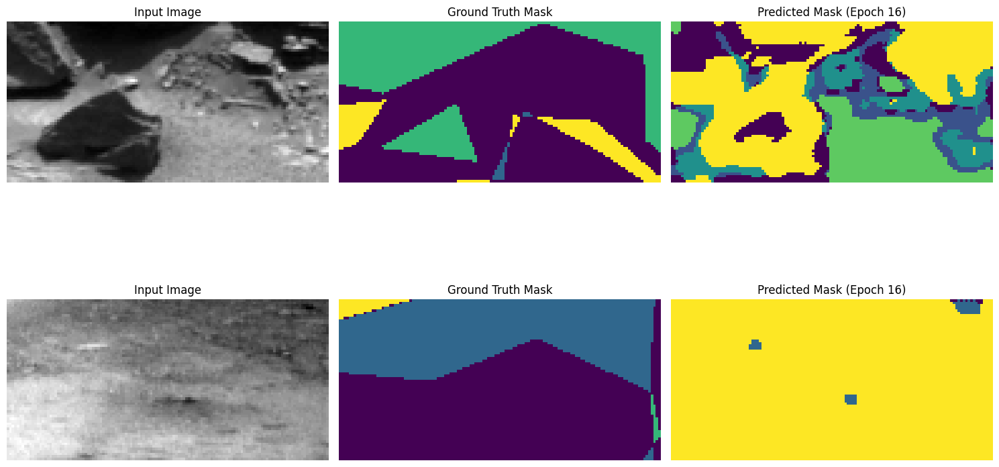

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - accuracy: 0.3698 - loss: 0.0083 - mean_io_u_1: 0.2044 - val_accuracy: 0.3643 - val_loss: 0.0073 - val_mean_io_u_1: 0.1821 - learning_rate: 0.0010
Epoch 17/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3804 - loss: 0.0082 - mean_io_u_1: 0.2131
Epoch 17: val_loss improved from 0.00704 to 0.00702, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


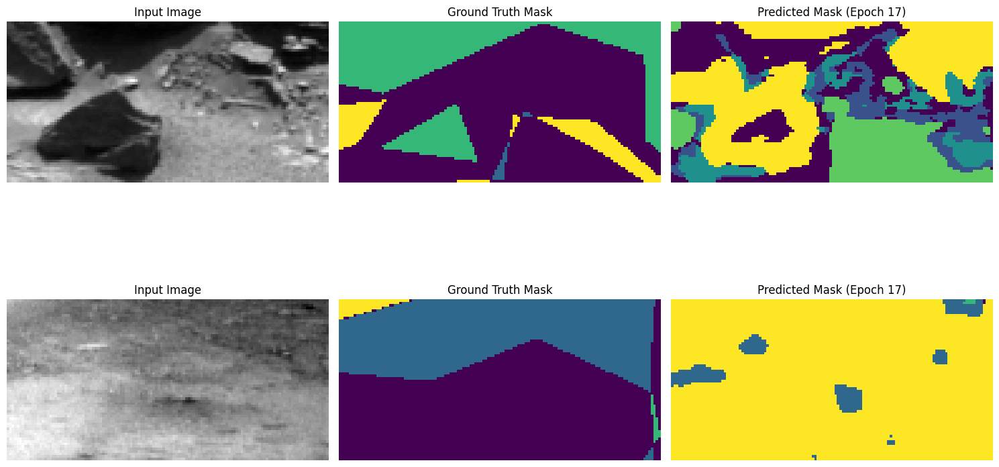

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 96ms/step - accuracy: 0.3805 - loss: 0.0082 - mean_io_u_1: 0.2133 - val_accuracy: 0.4020 - val_loss: 0.0070 - val_mean_io_u_1: 0.2046 - learning_rate: 0.0010
Epoch 18/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3887 - loss: 0.0082 - mean_io_u_1: 0.2152
Epoch 18: val_loss improved from 0.00702 to 0.00701, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


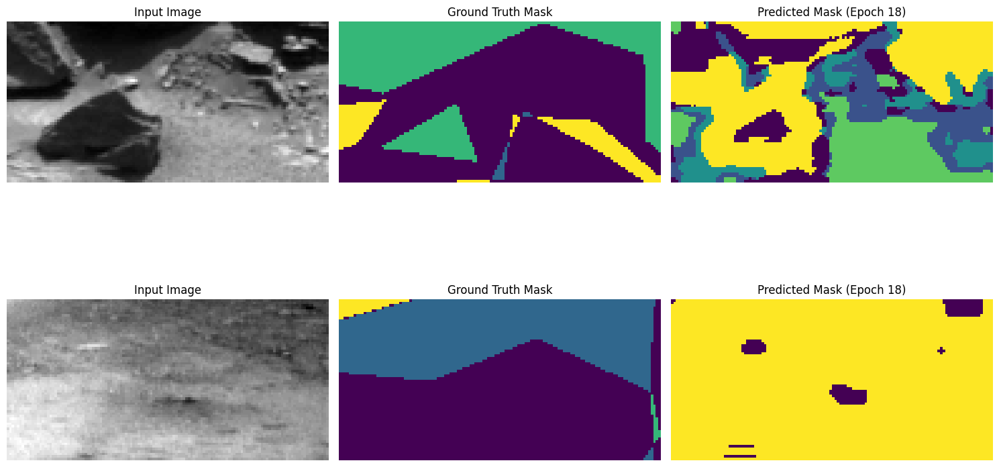

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - accuracy: 0.3888 - loss: 0.0082 - mean_io_u_1: 0.2153 - val_accuracy: 0.4111 - val_loss: 0.0070 - val_mean_io_u_1: 0.2151 - learning_rate: 0.0010
Epoch 19/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3983 - loss: 0.0081 - mean_io_u_1: 0.2225
Epoch 19: val_loss did not improve from 0.00701

Epoch 19: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


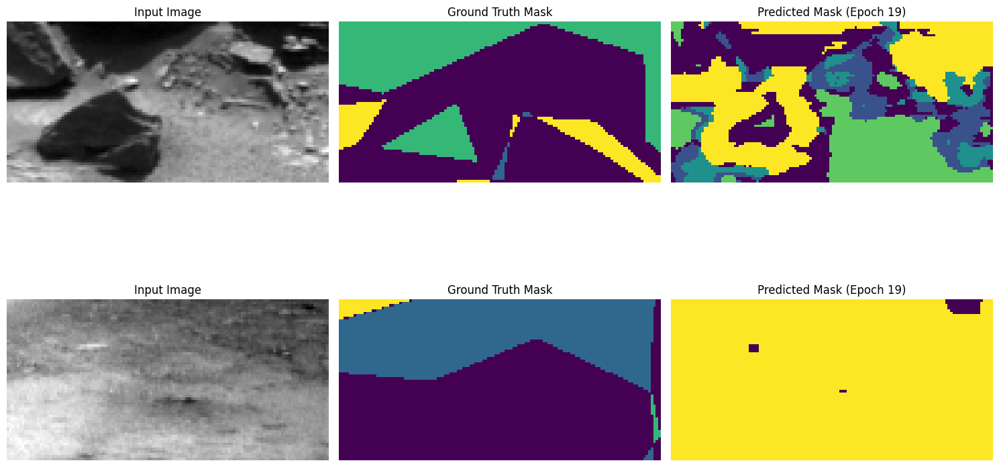

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.3984 - loss: 0.0081 - mean_io_u_1: 0.2226 - val_accuracy: 0.3992 - val_loss: 0.0070 - val_mean_io_u_1: 0.1985 - learning_rate: 0.0010
Epoch 20/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4090 - loss: 0.0080 - mean_io_u_1: 0.2291
Epoch 20: val_loss improved from 0.00701 to 0.00675, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


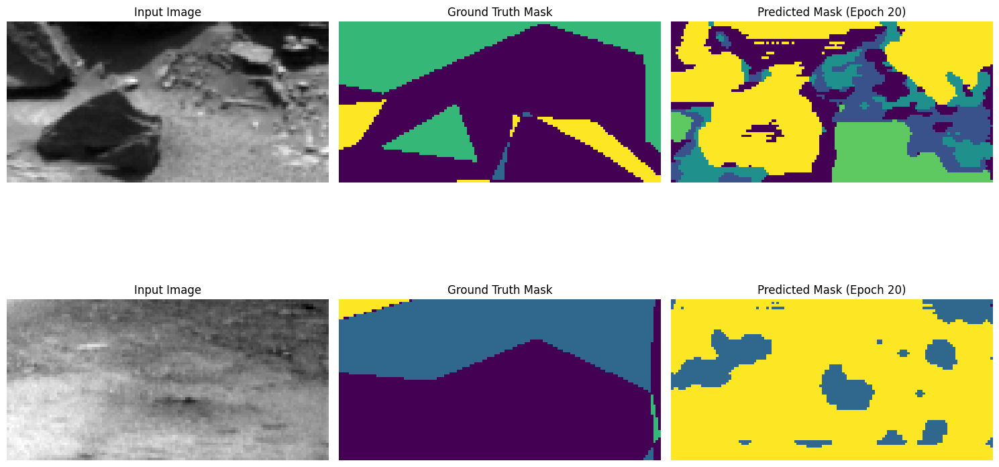

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.4093 - loss: 0.0080 - mean_io_u_1: 0.2293 - val_accuracy: 0.4519 - val_loss: 0.0068 - val_mean_io_u_1: 0.2491 - learning_rate: 5.0000e-04
Epoch 21/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.4260 - loss: 0.0079 - mean_io_u_1: 0.2400
Epoch 21: val_loss did not improve from 0.00675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


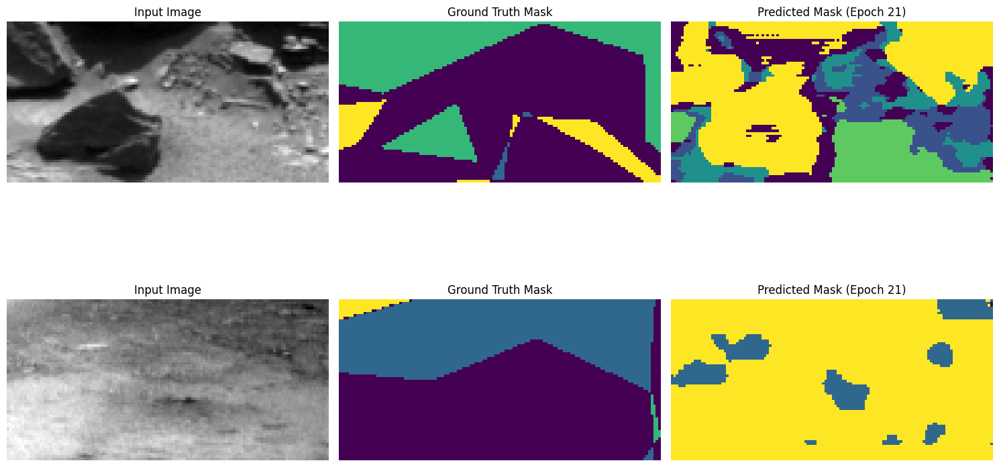

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.4261 - loss: 0.0079 - mean_io_u_1: 0.2400 - val_accuracy: 0.4480 - val_loss: 0.0068 - val_mean_io_u_1: 0.2433 - learning_rate: 5.0000e-04
Epoch 22/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4319 - loss: 0.0078 - mean_io_u_1: 0.2437
Epoch 22: val_loss improved from 0.00675 to 0.00670, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


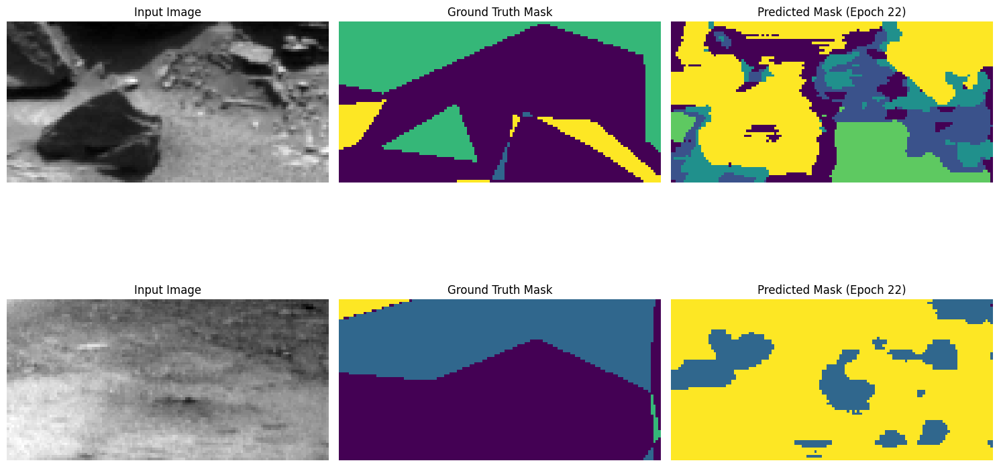

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.4320 - loss: 0.0078 - mean_io_u_1: 0.2438 - val_accuracy: 0.4648 - val_loss: 0.0067 - val_mean_io_u_1: 0.2574 - learning_rate: 5.0000e-04
Epoch 23/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.4351 - loss: 0.0078 - mean_io_u_1: 0.2436
Epoch 23: val_loss did not improve from 0.00670
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


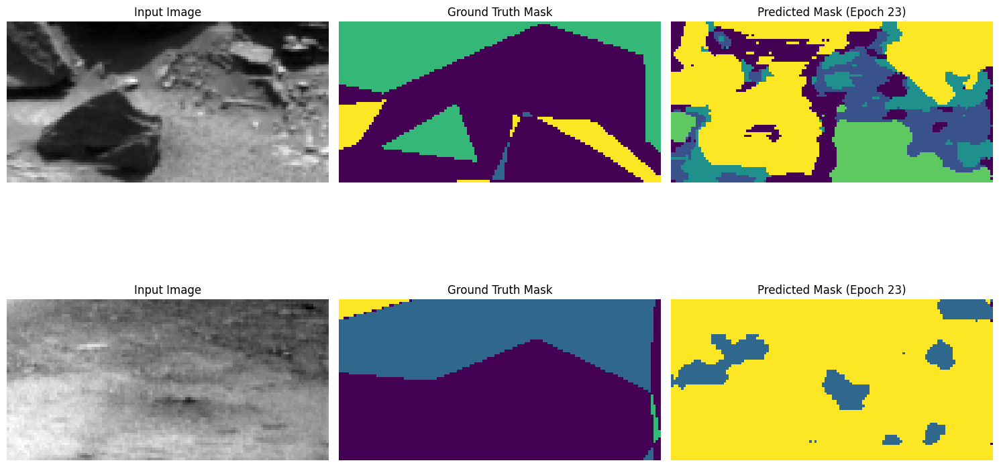

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.4353 - loss: 0.0078 - mean_io_u_1: 0.2437 - val_accuracy: 0.4564 - val_loss: 0.0068 - val_mean_io_u_1: 0.2480 - learning_rate: 5.0000e-04
Epoch 24/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.4407 - loss: 0.0078 - mean_io_u_1: 0.2488
Epoch 24: val_loss improved from 0.00670 to 0.00667, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


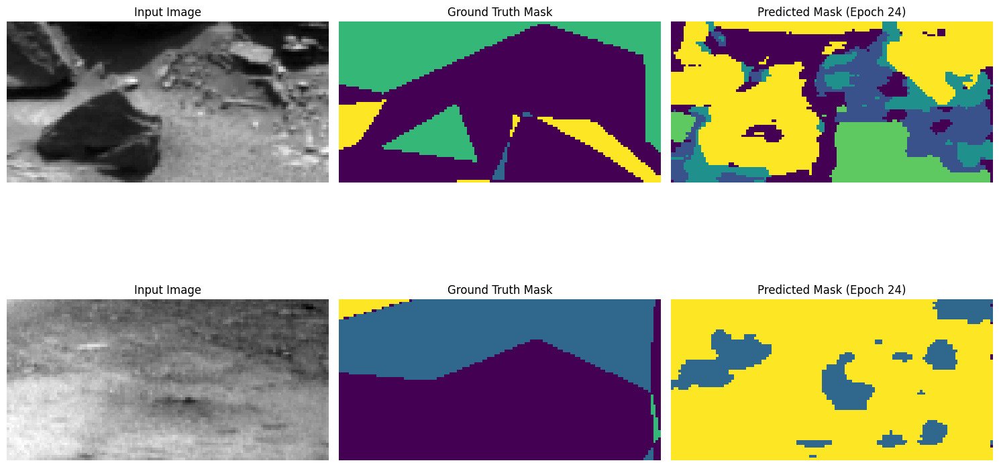

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - accuracy: 0.4408 - loss: 0.0078 - mean_io_u_1: 0.2489 - val_accuracy: 0.4714 - val_loss: 0.0067 - val_mean_io_u_1: 0.2580 - learning_rate: 5.0000e-04
Epoch 25/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.4424 - loss: 0.0078 - mean_io_u_1: 0.2477
Epoch 25: val_loss did not improve from 0.00667

Epoch 25: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


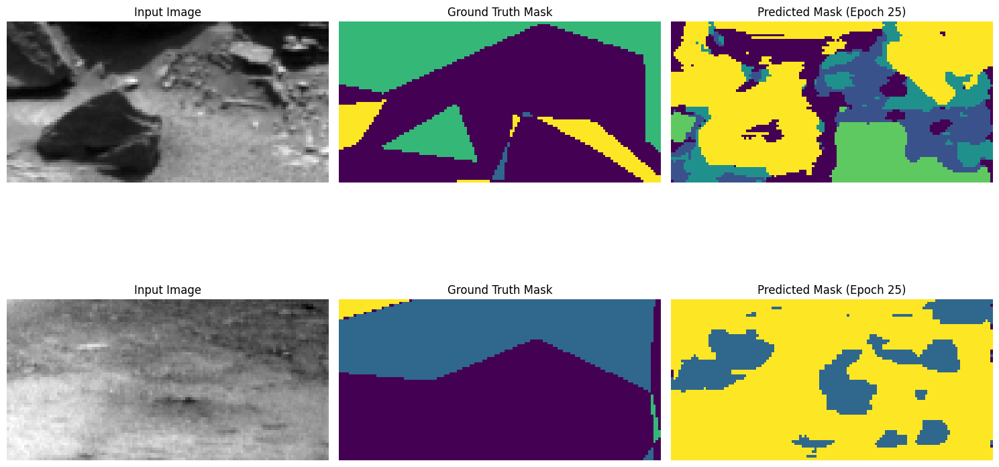

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.4425 - loss: 0.0078 - mean_io_u_1: 0.2478 - val_accuracy: 0.4766 - val_loss: 0.0067 - val_mean_io_u_1: 0.2633 - learning_rate: 5.0000e-04
Epoch 26/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4538 - loss: 0.0077 - mean_io_u_1: 0.2565
Epoch 26: val_loss improved from 0.00667 to 0.00661, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


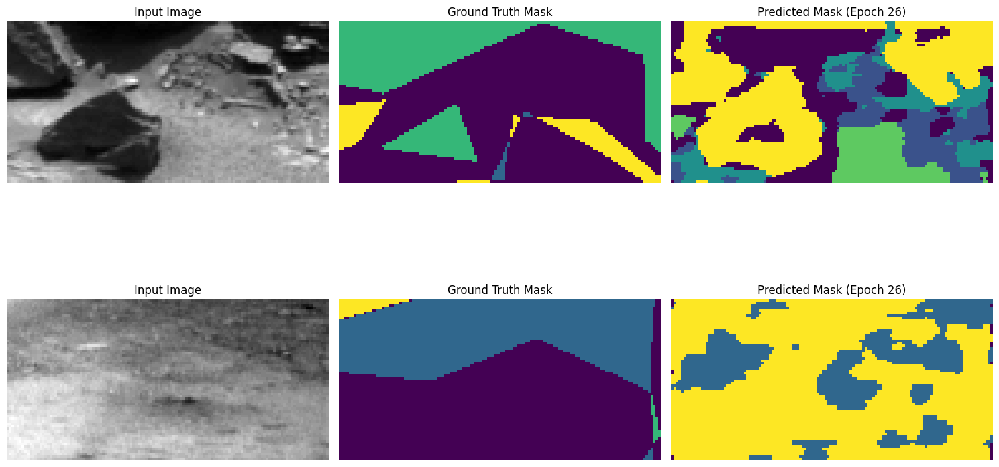

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.4540 - loss: 0.0077 - mean_io_u_1: 0.2566 - val_accuracy: 0.4854 - val_loss: 0.0066 - val_mean_io_u_1: 0.2706 - learning_rate: 2.5000e-04
Epoch 27/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4629 - loss: 0.0076 - mean_io_u_1: 0.2625
Epoch 27: val_loss improved from 0.00661 to 0.00658, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


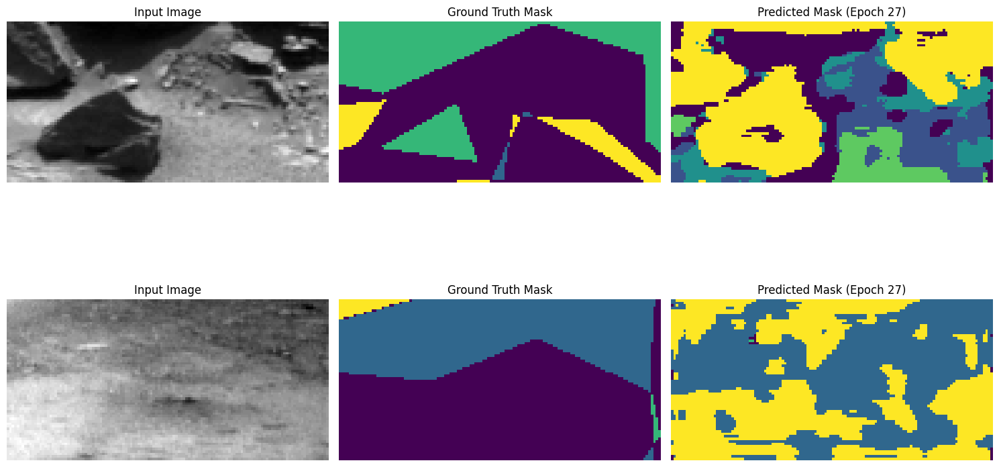

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.4631 - loss: 0.0076 - mean_io_u_1: 0.2626 - val_accuracy: 0.4972 - val_loss: 0.0066 - val_mean_io_u_1: 0.2816 - learning_rate: 2.5000e-04
Epoch 28/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.4683 - loss: 0.0075 - mean_io_u_1: 0.2645
Epoch 28: val_loss improved from 0.00658 to 0.00656, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


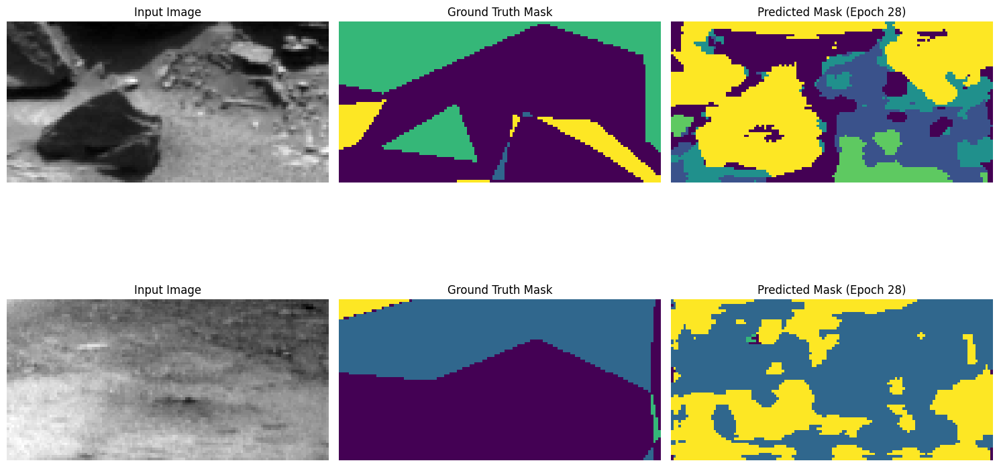

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.4685 - loss: 0.0075 - mean_io_u_1: 0.2646 - val_accuracy: 0.5027 - val_loss: 0.0066 - val_mean_io_u_1: 0.2844 - learning_rate: 2.5000e-04
Epoch 29/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4735 - loss: 0.0075 - mean_io_u_1: 0.2669
Epoch 29: val_loss improved from 0.00656 to 0.00655, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


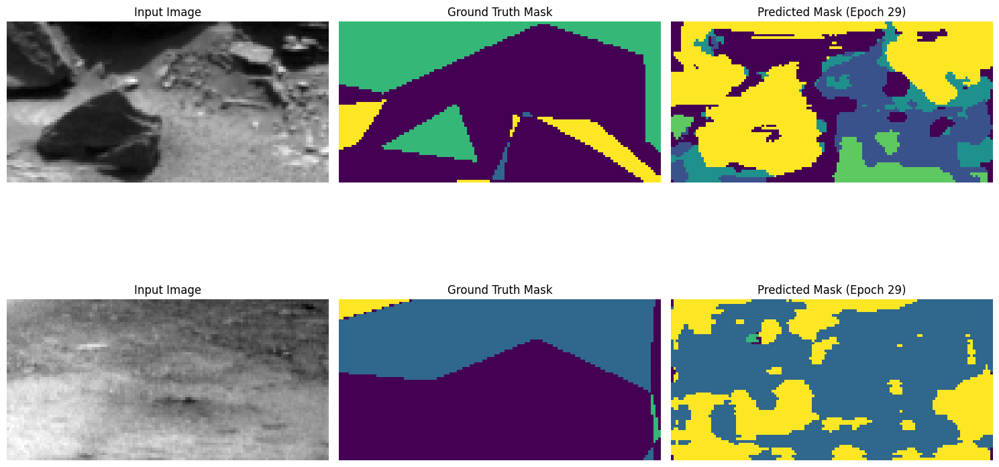

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.4736 - loss: 0.0075 - mean_io_u_1: 0.2670 - val_accuracy: 0.5061 - val_loss: 0.0065 - val_mean_io_u_1: 0.2848 - learning_rate: 2.5000e-04
Epoch 30/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.4780 - loss: 0.0075 - mean_io_u_1: 0.2688
Epoch 30: val_loss improved from 0.00655 to 0.00652, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


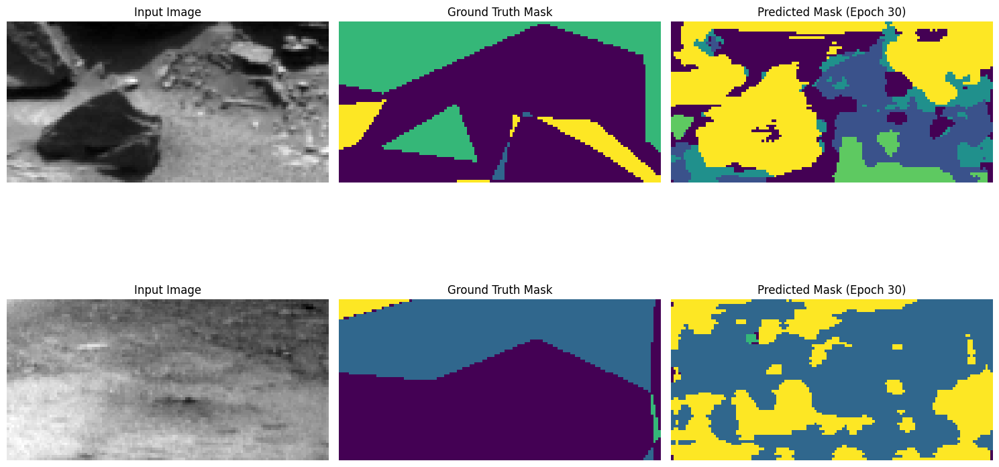

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.4782 - loss: 0.0075 - mean_io_u_1: 0.2689 - val_accuracy: 0.5096 - val_loss: 0.0065 - val_mean_io_u_1: 0.2857 - learning_rate: 2.5000e-04
Epoch 31/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4827 - loss: 0.0074 - mean_io_u_1: 0.2717
Epoch 31: val_loss improved from 0.00652 to 0.00649, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


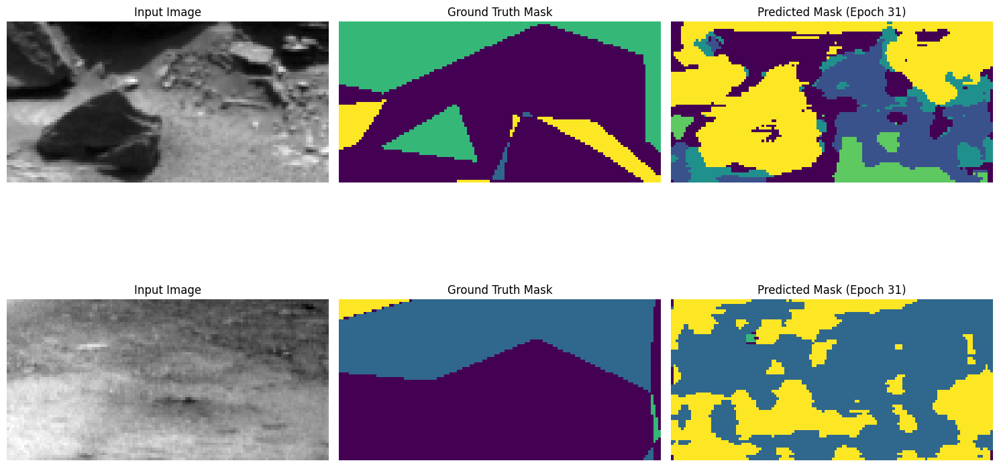

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.4828 - loss: 0.0074 - mean_io_u_1: 0.2718 - val_accuracy: 0.5142 - val_loss: 0.0065 - val_mean_io_u_1: 0.2876 - learning_rate: 2.5000e-04
Epoch 32/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.4883 - loss: 0.0074 - mean_io_u_1: 0.2744
Epoch 32: val_loss improved from 0.00649 to 0.00646, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


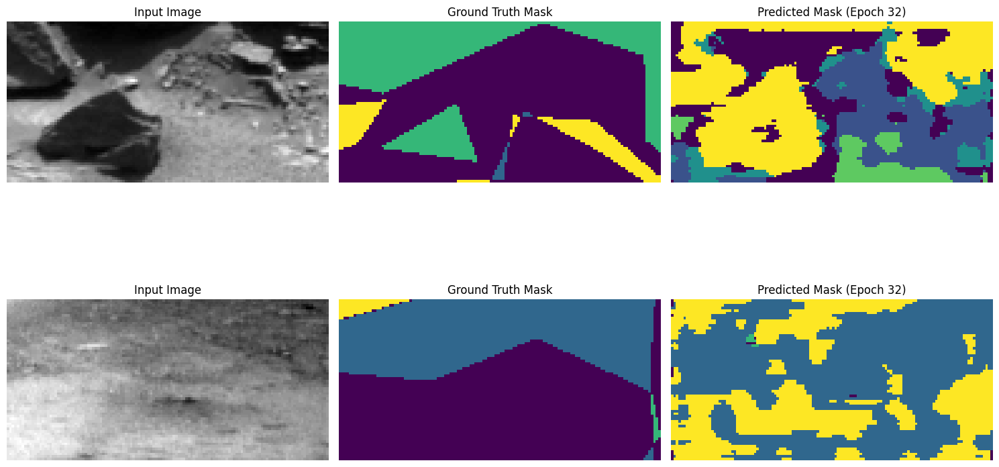

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.4884 - loss: 0.0074 - mean_io_u_1: 0.2745 - val_accuracy: 0.5181 - val_loss: 0.0065 - val_mean_io_u_1: 0.2893 - learning_rate: 2.5000e-04
Epoch 33/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4928 - loss: 0.0074 - mean_io_u_1: 0.2774
Epoch 33: val_loss improved from 0.00646 to 0.00644, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


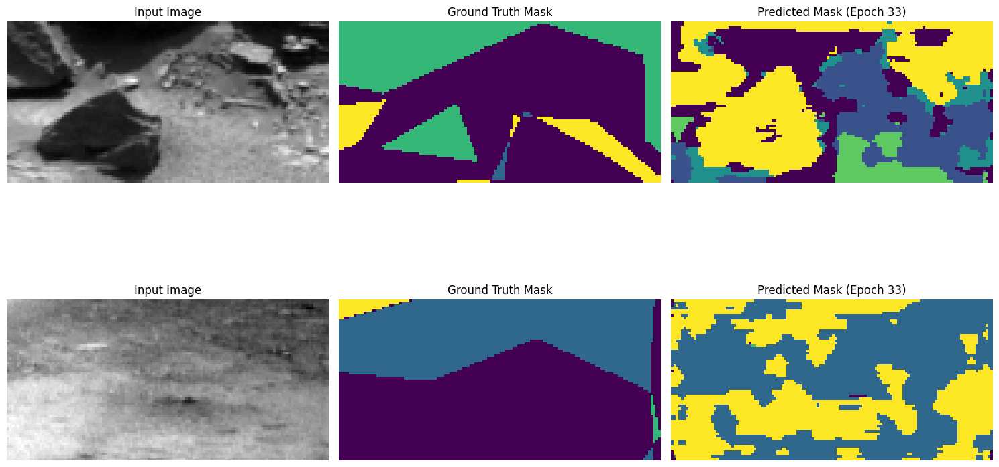

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.4929 - loss: 0.0073 - mean_io_u_1: 0.2774 - val_accuracy: 0.5220 - val_loss: 0.0064 - val_mean_io_u_1: 0.2901 - learning_rate: 2.5000e-04
Epoch 34/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4954 - loss: 0.0073 - mean_io_u_1: 0.2794
Epoch 34: val_loss improved from 0.00644 to 0.00640, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


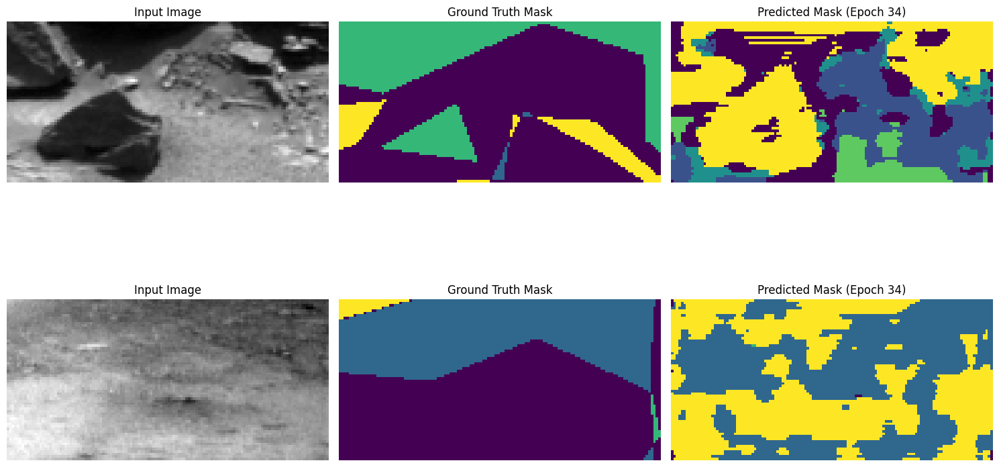

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - accuracy: 0.4955 - loss: 0.0073 - mean_io_u_1: 0.2794 - val_accuracy: 0.5245 - val_loss: 0.0064 - val_mean_io_u_1: 0.2904 - learning_rate: 2.5000e-04
Epoch 35/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4981 - loss: 0.0073 - mean_io_u_1: 0.2798
Epoch 35: val_loss improved from 0.00640 to 0.00639, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


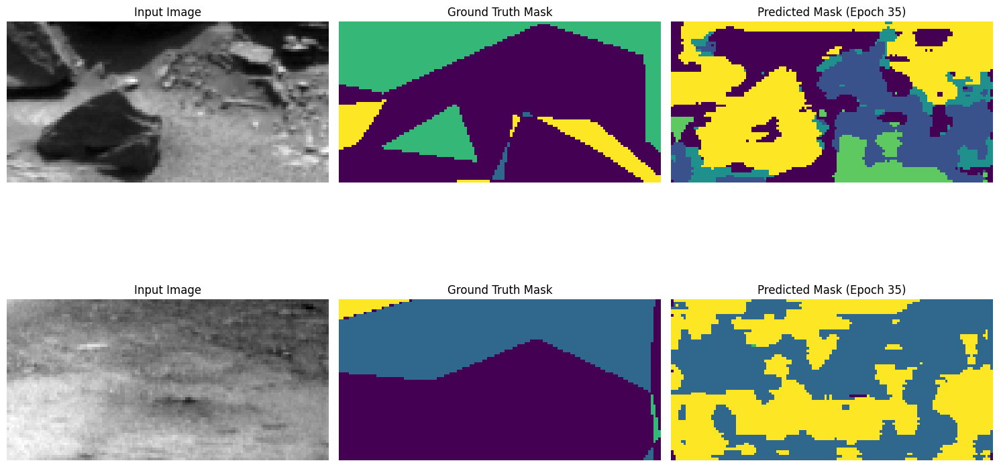

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.4982 - loss: 0.0073 - mean_io_u_1: 0.2798 - val_accuracy: 0.5278 - val_loss: 0.0064 - val_mean_io_u_1: 0.2913 - learning_rate: 2.5000e-04
Epoch 36/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5015 - loss: 0.0073 - mean_io_u_1: 0.2816
Epoch 36: val_loss improved from 0.00639 to 0.00638, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


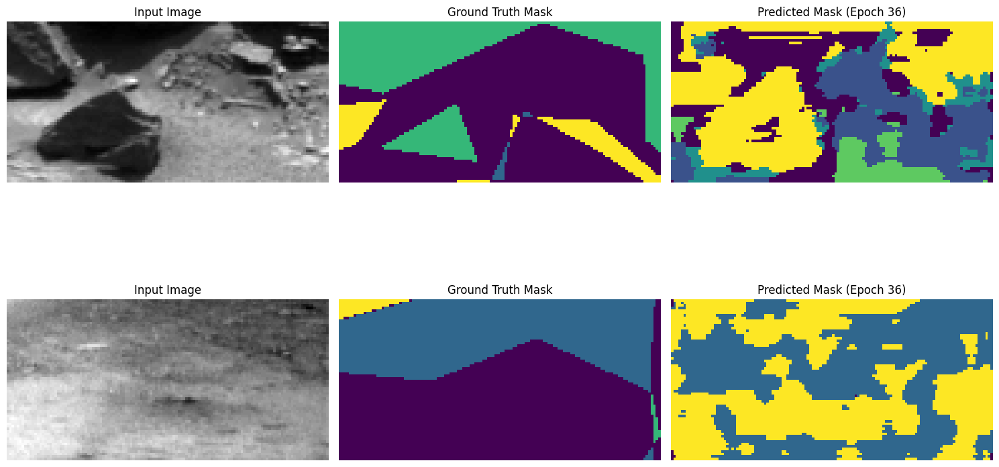

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.5016 - loss: 0.0073 - mean_io_u_1: 0.2817 - val_accuracy: 0.5298 - val_loss: 0.0064 - val_mean_io_u_1: 0.2925 - learning_rate: 2.5000e-04
Epoch 37/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5033 - loss: 0.0073 - mean_io_u_1: 0.2826
Epoch 37: val_loss improved from 0.00638 to 0.00637, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


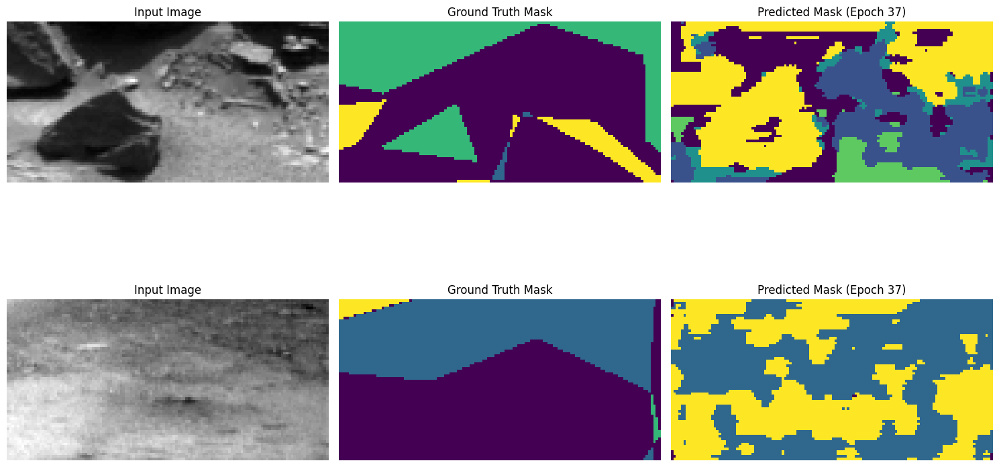

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.5034 - loss: 0.0072 - mean_io_u_1: 0.2827 - val_accuracy: 0.5330 - val_loss: 0.0064 - val_mean_io_u_1: 0.2939 - learning_rate: 2.5000e-04
Epoch 38/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5061 - loss: 0.0072 - mean_io_u_1: 0.2845
Epoch 38: val_loss improved from 0.00637 to 0.00636, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


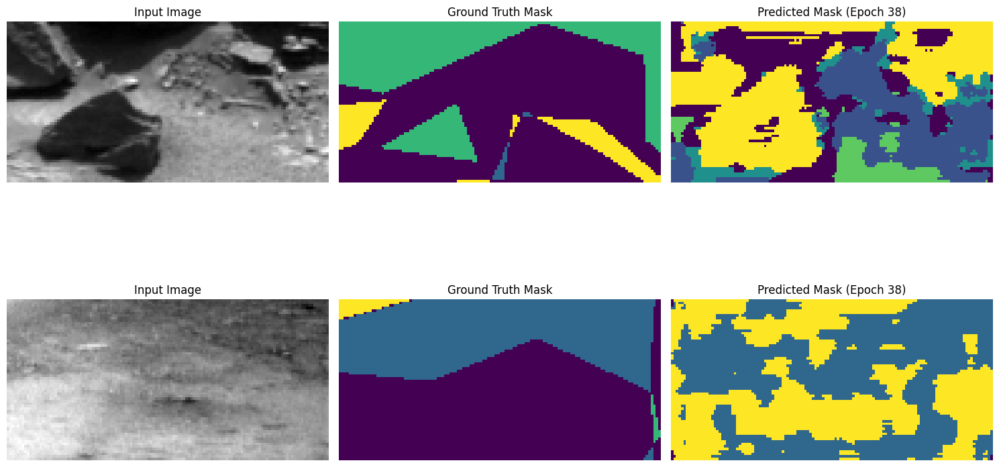

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.5062 - loss: 0.0072 - mean_io_u_1: 0.2845 - val_accuracy: 0.5344 - val_loss: 0.0064 - val_mean_io_u_1: 0.2944 - learning_rate: 2.5000e-04
Epoch 39/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5081 - loss: 0.0072 - mean_io_u_1: 0.2855
Epoch 39: val_loss improved from 0.00636 to 0.00635, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


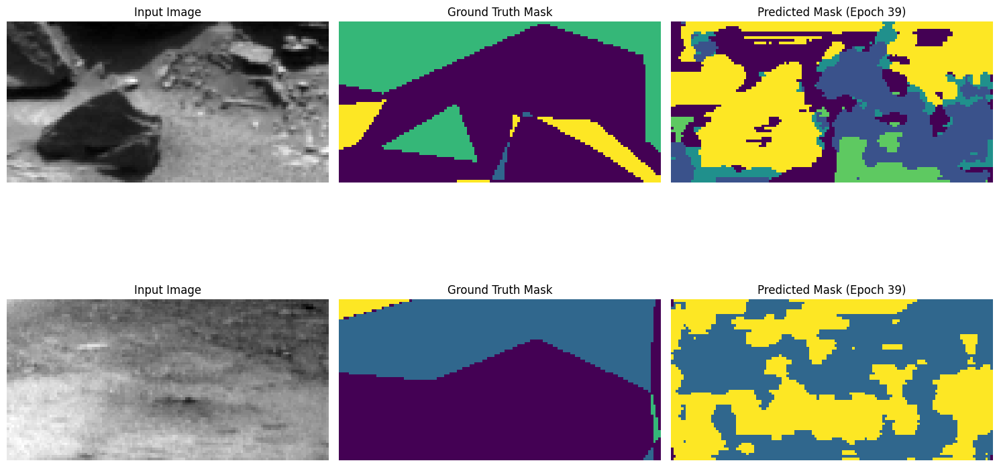

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.5082 - loss: 0.0072 - mean_io_u_1: 0.2855 - val_accuracy: 0.5356 - val_loss: 0.0064 - val_mean_io_u_1: 0.2961 - learning_rate: 2.5000e-04
Epoch 40/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5095 - loss: 0.0072 - mean_io_u_1: 0.2867
Epoch 40: val_loss improved from 0.00635 to 0.00634, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


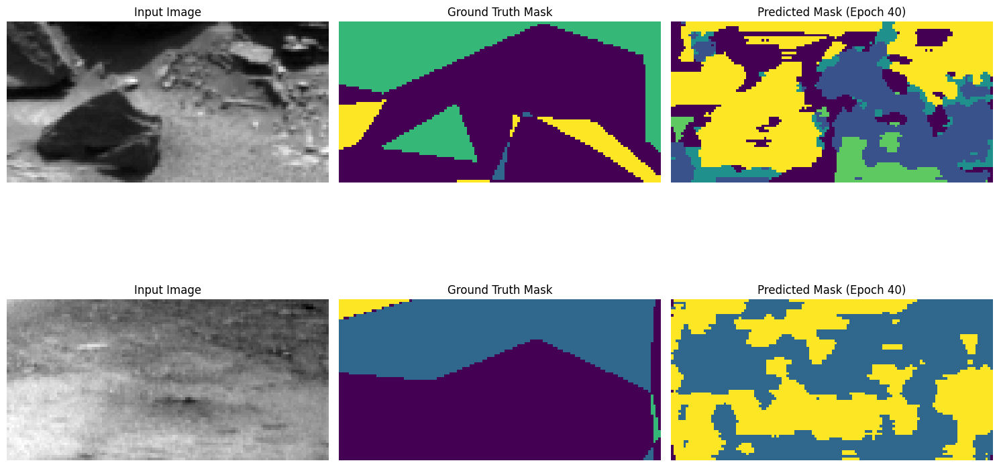

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 95ms/step - accuracy: 0.5096 - loss: 0.0072 - mean_io_u_1: 0.2867 - val_accuracy: 0.5382 - val_loss: 0.0063 - val_mean_io_u_1: 0.2970 - learning_rate: 2.5000e-04
Epoch 41/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5121 - loss: 0.0071 - mean_io_u_1: 0.2874
Epoch 41: val_loss did not improve from 0.00634

Epoch 41: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


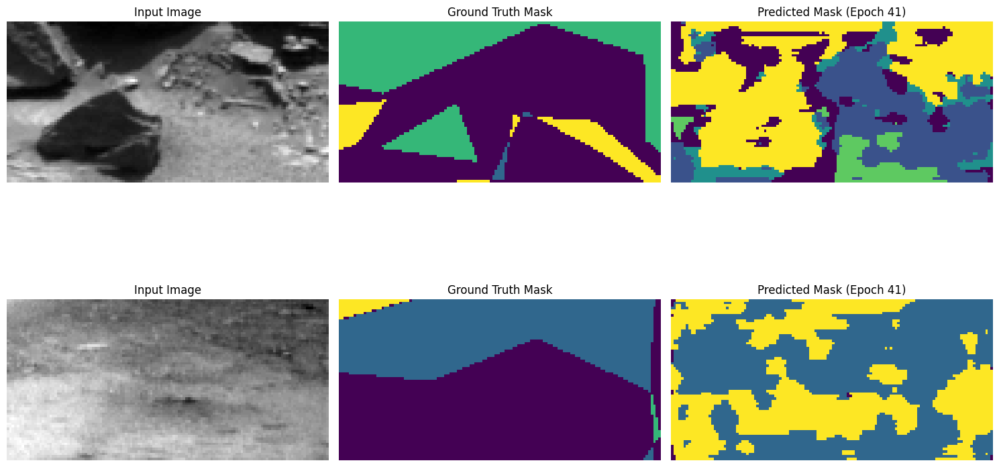

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.5122 - loss: 0.0071 - mean_io_u_1: 0.2875 - val_accuracy: 0.5389 - val_loss: 0.0063 - val_mean_io_u_1: 0.2995 - learning_rate: 2.5000e-04
Epoch 42/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5190 - loss: 0.0071 - mean_io_u_1: 0.2936
Epoch 42: val_loss improved from 0.00634 to 0.00628, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


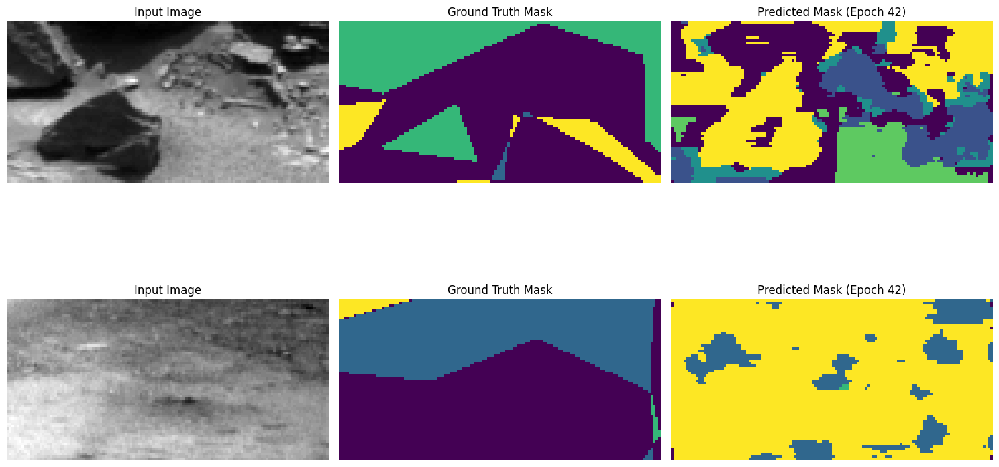

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.5192 - loss: 0.0071 - mean_io_u_1: 0.2937 - val_accuracy: 0.5373 - val_loss: 0.0063 - val_mean_io_u_1: 0.2901 - learning_rate: 1.2500e-04
Epoch 43/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5239 - loss: 0.0070 - mean_io_u_1: 0.2977
Epoch 43: val_loss improved from 0.00628 to 0.00625, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


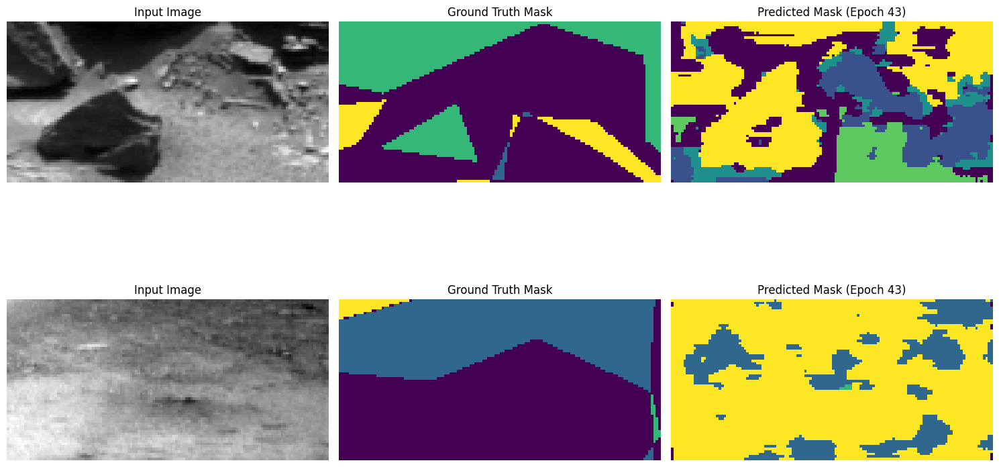

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.5240 - loss: 0.0070 - mean_io_u_1: 0.2978 - val_accuracy: 0.5390 - val_loss: 0.0063 - val_mean_io_u_1: 0.2948 - learning_rate: 1.2500e-04
Epoch 44/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5263 - loss: 0.0070 - mean_io_u_1: 0.2984
Epoch 44: val_loss improved from 0.00625 to 0.00624, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


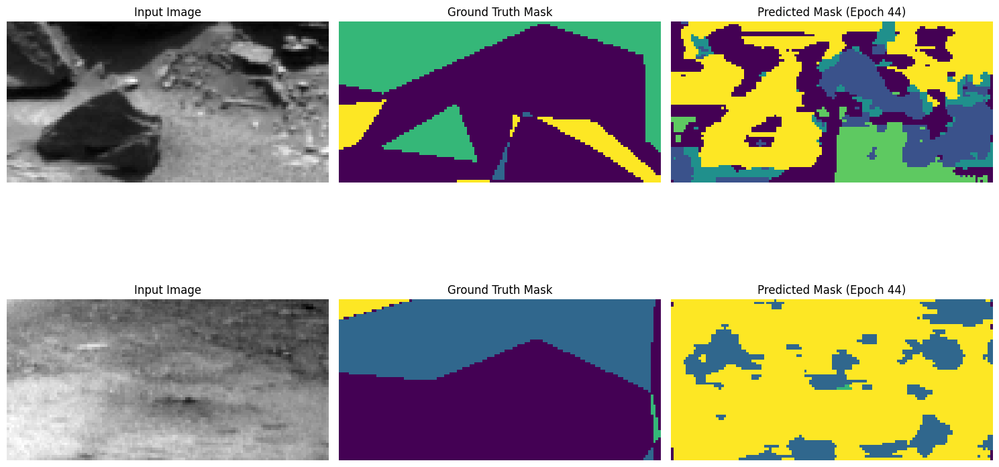

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.5264 - loss: 0.0070 - mean_io_u_1: 0.2984 - val_accuracy: 0.5411 - val_loss: 0.0062 - val_mean_io_u_1: 0.2950 - learning_rate: 1.2500e-04
Epoch 45/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5289 - loss: 0.0070 - mean_io_u_1: 0.2992
Epoch 45: val_loss improved from 0.00624 to 0.00623, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


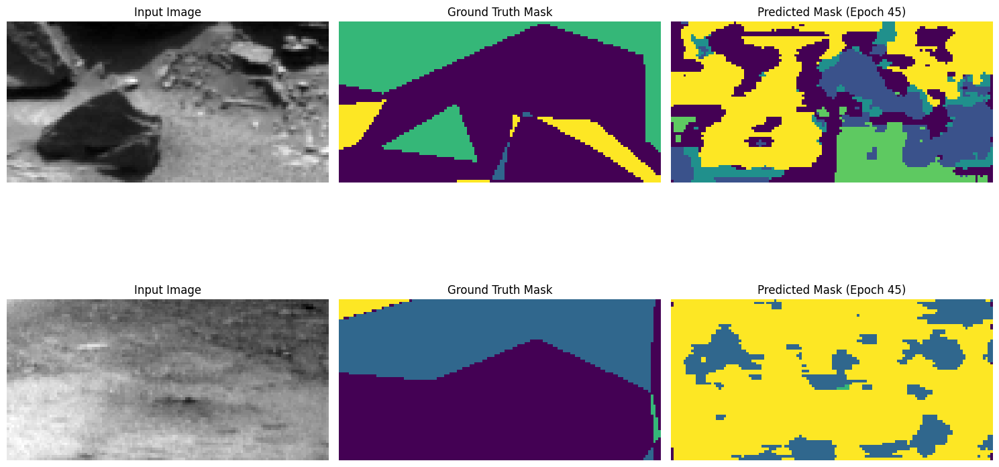

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.5289 - loss: 0.0070 - mean_io_u_1: 0.2992 - val_accuracy: 0.5429 - val_loss: 0.0062 - val_mean_io_u_1: 0.2960 - learning_rate: 1.2500e-04
Epoch 46/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5306 - loss: 0.0069 - mean_io_u_1: 0.3004
Epoch 46: val_loss improved from 0.00623 to 0.00623, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


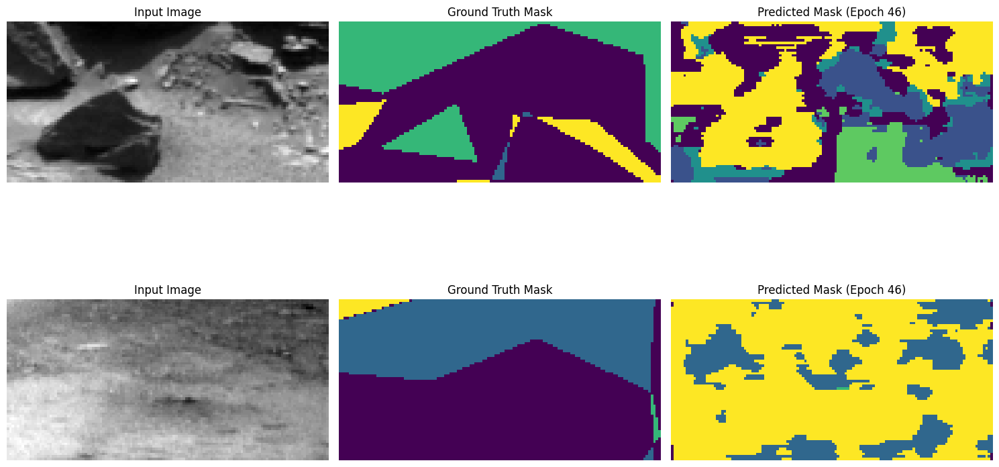

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.5307 - loss: 0.0069 - mean_io_u_1: 0.3004 - val_accuracy: 0.5453 - val_loss: 0.0062 - val_mean_io_u_1: 0.2980 - learning_rate: 1.2500e-04
Epoch 47/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5312 - loss: 0.0069 - mean_io_u_1: 0.3014
Epoch 47: val_loss improved from 0.00623 to 0.00622, saving model to best_model.keras

Epoch 47: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


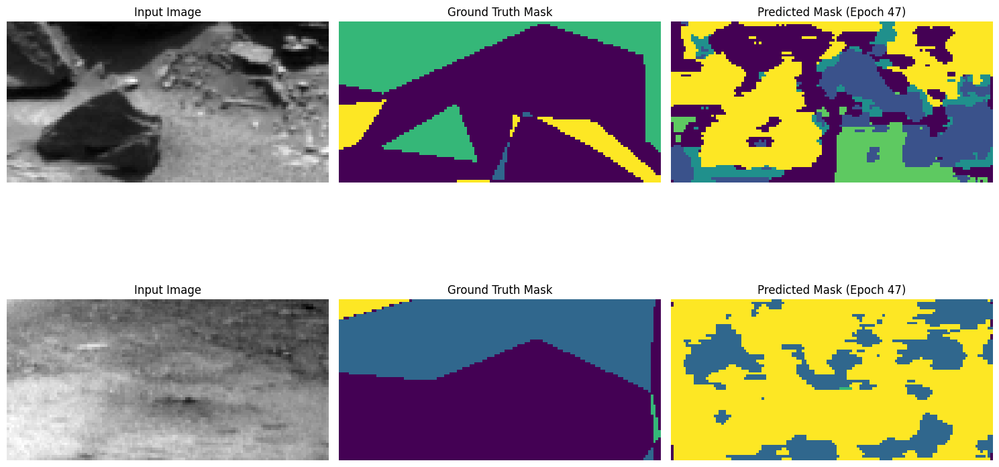

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.5313 - loss: 0.0069 - mean_io_u_1: 0.3014 - val_accuracy: 0.5469 - val_loss: 0.0062 - val_mean_io_u_1: 0.2998 - learning_rate: 1.2500e-04
Epoch 48/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5348 - loss: 0.0069 - mean_io_u_1: 0.3042
Epoch 48: val_loss improved from 0.00622 to 0.00620, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


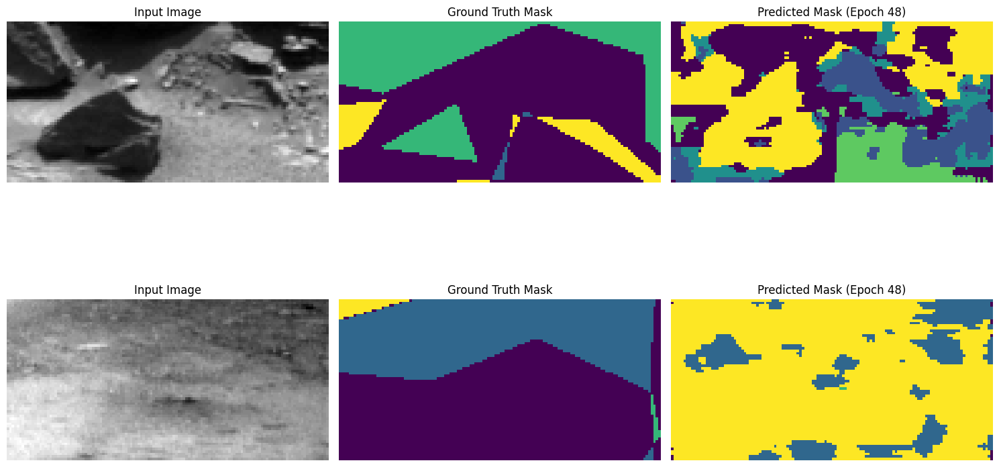

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.5349 - loss: 0.0069 - mean_io_u_1: 0.3043 - val_accuracy: 0.5473 - val_loss: 0.0062 - val_mean_io_u_1: 0.2974 - learning_rate: 6.2500e-05
Epoch 49/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5357 - loss: 0.0069 - mean_io_u_1: 0.3045
Epoch 49: val_loss improved from 0.00620 to 0.00620, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


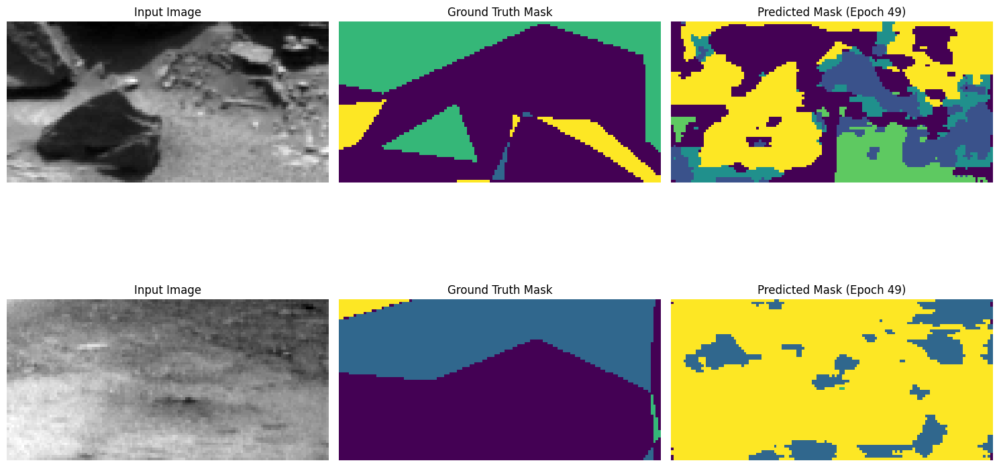

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.5358 - loss: 0.0068 - mean_io_u_1: 0.3045 - val_accuracy: 0.5482 - val_loss: 0.0062 - val_mean_io_u_1: 0.2981 - learning_rate: 6.2500e-05
Epoch 50/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5361 - loss: 0.0068 - mean_io_u_1: 0.3052
Epoch 50: val_loss improved from 0.00620 to 0.00620, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


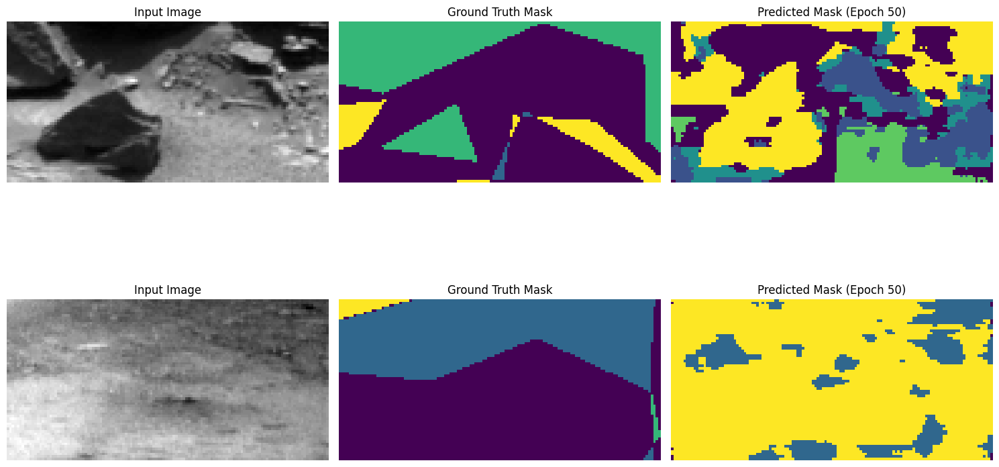

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.5363 - loss: 0.0068 - mean_io_u_1: 0.3053 - val_accuracy: 0.5487 - val_loss: 0.0062 - val_mean_io_u_1: 0.2983 - learning_rate: 6.2500e-05
Epoch 51/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5369 - loss: 0.0068 - mean_io_u_1: 0.3057
Epoch 51: val_loss improved from 0.00620 to 0.00619, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


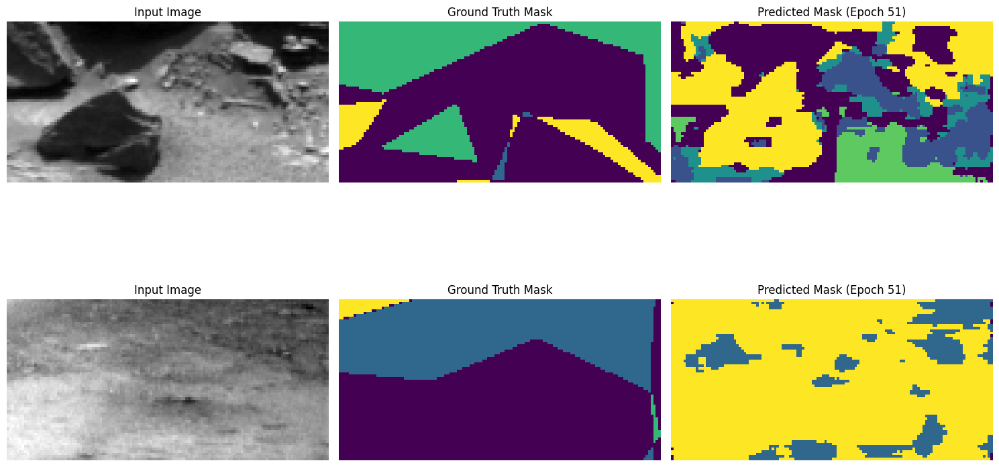

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - accuracy: 0.5370 - loss: 0.0068 - mean_io_u_1: 0.3058 - val_accuracy: 0.5497 - val_loss: 0.0062 - val_mean_io_u_1: 0.2989 - learning_rate: 6.2500e-05
Epoch 52/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5376 - loss: 0.0068 - mean_io_u_1: 0.3063
Epoch 52: val_loss improved from 0.00619 to 0.00619, saving model to best_model.keras

Epoch 52: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


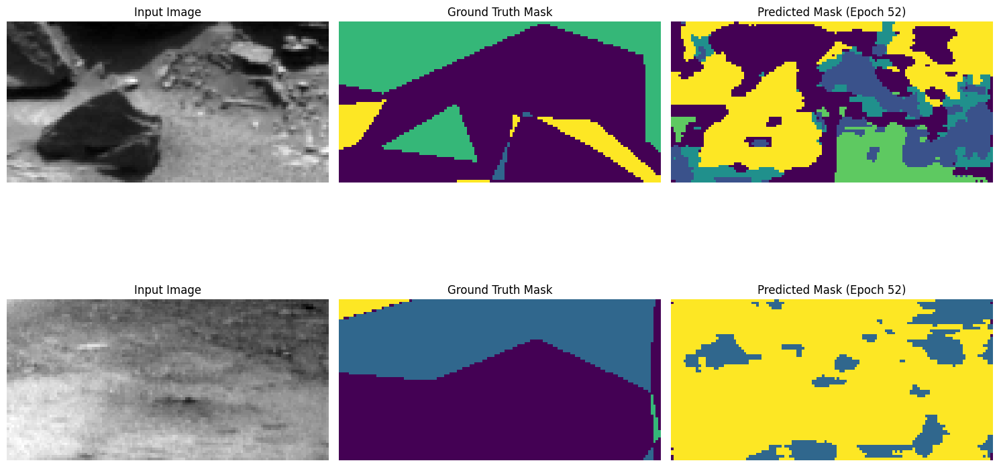

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.5378 - loss: 0.0068 - mean_io_u_1: 0.3063 - val_accuracy: 0.5504 - val_loss: 0.0062 - val_mean_io_u_1: 0.2994 - learning_rate: 6.2500e-05
Epoch 53/1000
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5385 - loss: 0.0068 - mean_io_u_1: 0.3070
Epoch 53: val_loss improved from 0.00619 to 0.00616, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


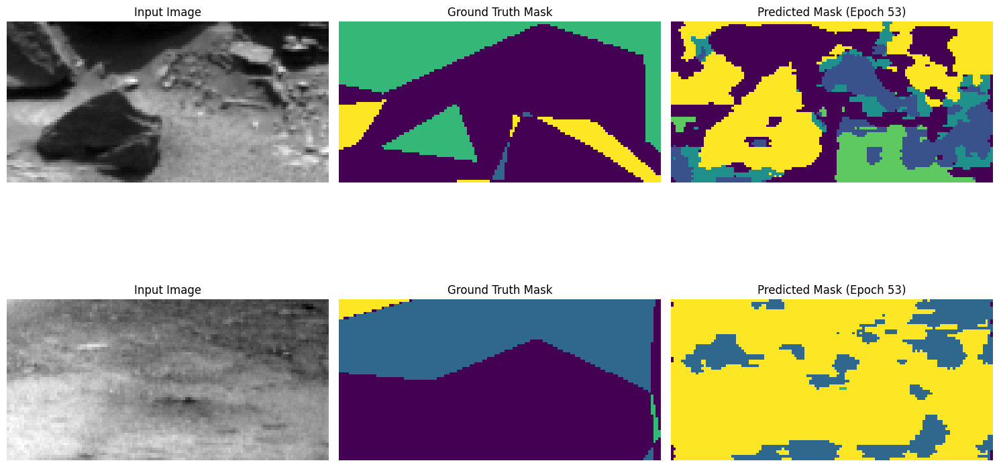

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.5386 - loss: 0.0068 - mean_io_u_1: 0.3070 - val_accuracy: 0.5537 - val_loss: 0.0062 - val_mean_io_u_1: 0.3011 - learning_rate: 3.1250e-05
Epoch 54/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5390 - loss: 0.0068 - mean_io_u_1: 0.3060
Epoch 54: val_loss improved from 0.00616 to 0.00616, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


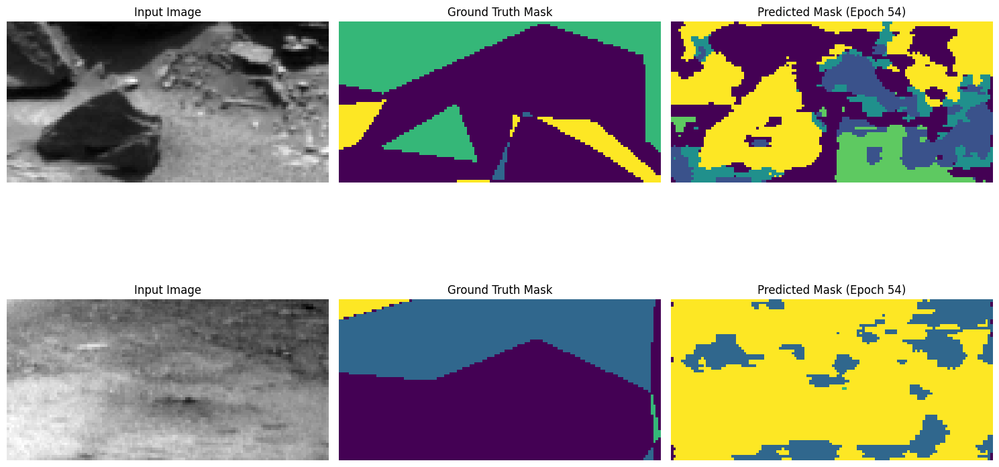

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.5391 - loss: 0.0068 - mean_io_u_1: 0.3061 - val_accuracy: 0.5540 - val_loss: 0.0062 - val_mean_io_u_1: 0.3013 - learning_rate: 3.1250e-05
Epoch 55/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5395 - loss: 0.0068 - mean_io_u_1: 0.3063
Epoch 55: val_loss improved from 0.00616 to 0.00616, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


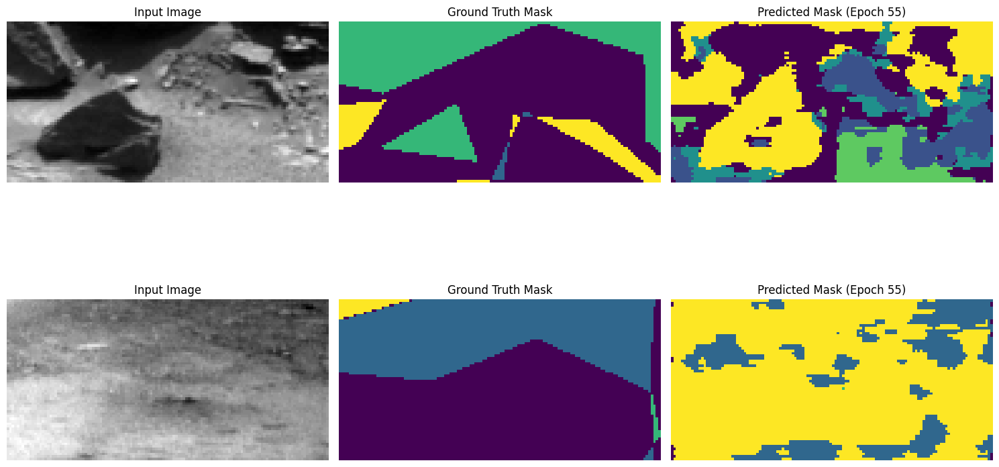

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - accuracy: 0.5397 - loss: 0.0068 - mean_io_u_1: 0.3064 - val_accuracy: 0.5543 - val_loss: 0.0062 - val_mean_io_u_1: 0.3015 - learning_rate: 3.1250e-05
Epoch 56/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5399 - loss: 0.0068 - mean_io_u_1: 0.3066
Epoch 56: val_loss improved from 0.00616 to 0.00616, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


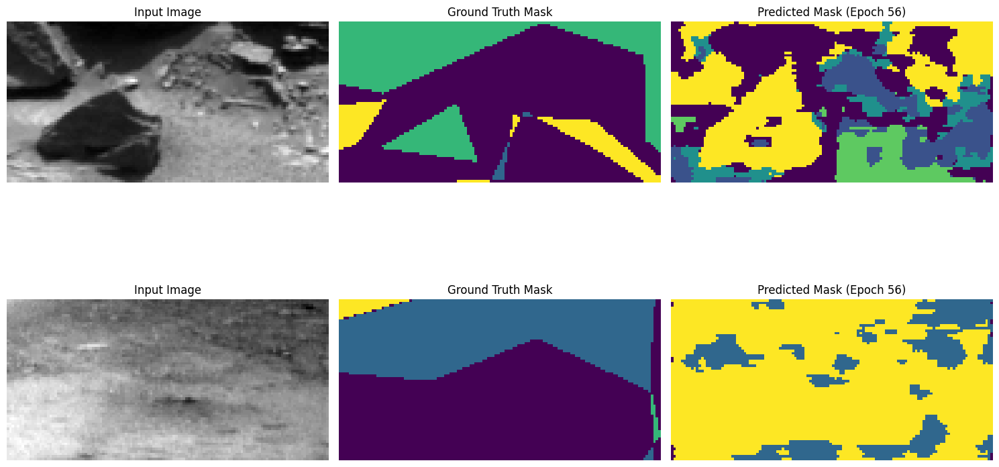

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.5401 - loss: 0.0068 - mean_io_u_1: 0.3067 - val_accuracy: 0.5546 - val_loss: 0.0062 - val_mean_io_u_1: 0.3017 - learning_rate: 3.1250e-05
Epoch 57/1000
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.5404 - loss: 0.0068 - mean_io_u_1: 0.3069
Epoch 57: val_loss improved from 0.00616 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


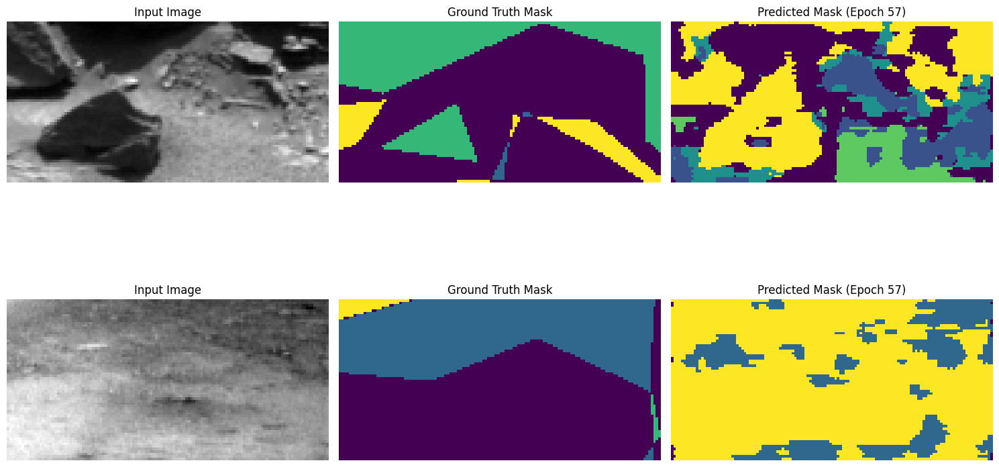

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - accuracy: 0.5404 - loss: 0.0067 - mean_io_u_1: 0.3070 - val_accuracy: 0.5549 - val_loss: 0.0062 - val_mean_io_u_1: 0.3019 - learning_rate: 3.1250e-05
Epoch 58/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5407 - loss: 0.0067 - mean_io_u_1: 0.3072
Epoch 58: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras

Epoch 58: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


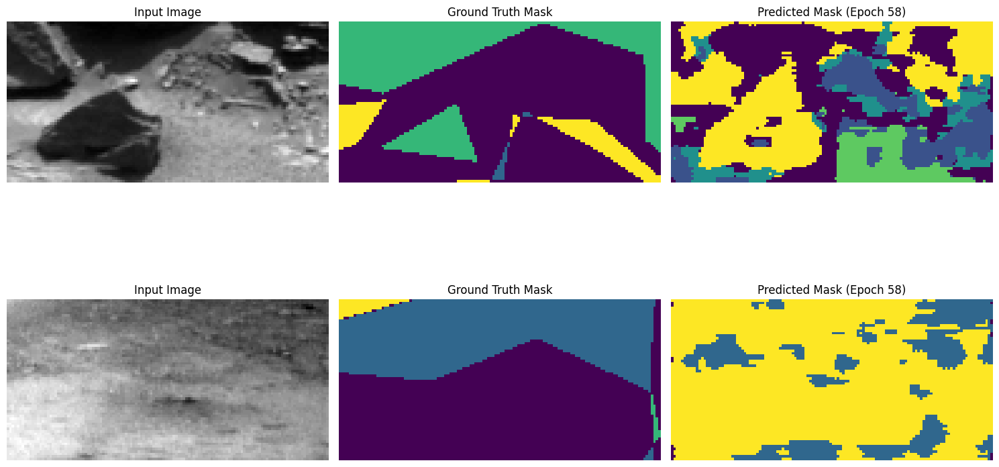

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.5408 - loss: 0.0067 - mean_io_u_1: 0.3073 - val_accuracy: 0.5552 - val_loss: 0.0062 - val_mean_io_u_1: 0.3021 - learning_rate: 3.1250e-05
Epoch 59/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5407 - loss: 0.0067 - mean_io_u_1: 0.3068
Epoch 59: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


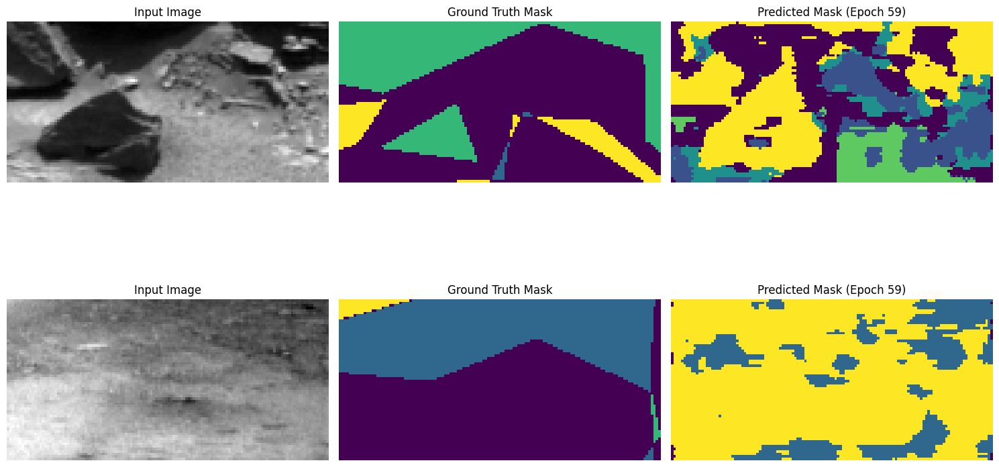

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.5409 - loss: 0.0067 - mean_io_u_1: 0.3070 - val_accuracy: 0.5560 - val_loss: 0.0062 - val_mean_io_u_1: 0.3031 - learning_rate: 1.5625e-05
Epoch 60/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5410 - loss: 0.0067 - mean_io_u_1: 0.3069
Epoch 60: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


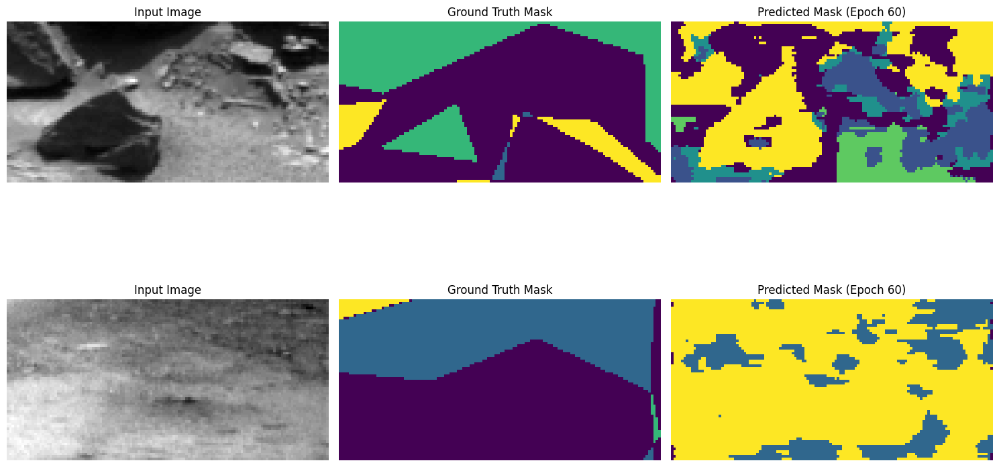

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.5412 - loss: 0.0067 - mean_io_u_1: 0.3070 - val_accuracy: 0.5564 - val_loss: 0.0061 - val_mean_io_u_1: 0.3032 - learning_rate: 1.5625e-05
Epoch 61/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.5413 - loss: 0.0067 - mean_io_u_1: 0.3070
Epoch 61: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


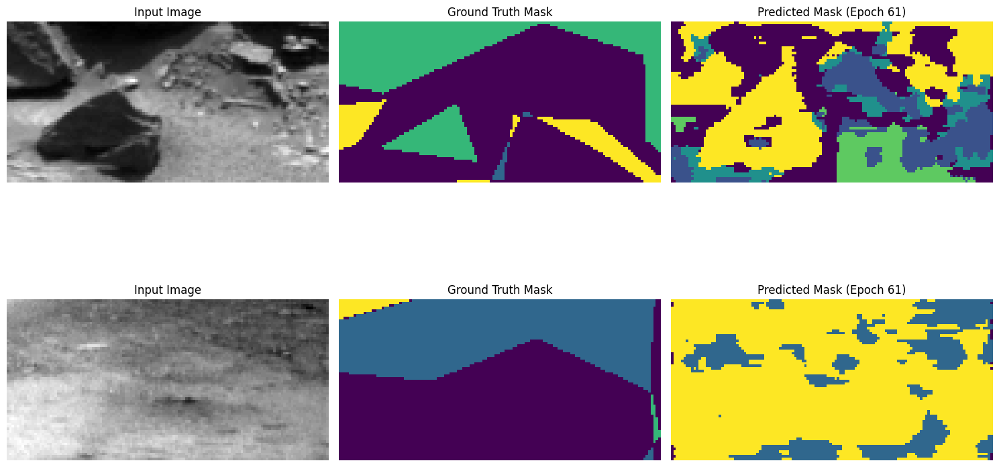

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.5415 - loss: 0.0067 - mean_io_u_1: 0.3071 - val_accuracy: 0.5565 - val_loss: 0.0061 - val_mean_io_u_1: 0.3032 - learning_rate: 1.5625e-05
Epoch 62/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5415 - loss: 0.0067 - mean_io_u_1: 0.3071
Epoch 62: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


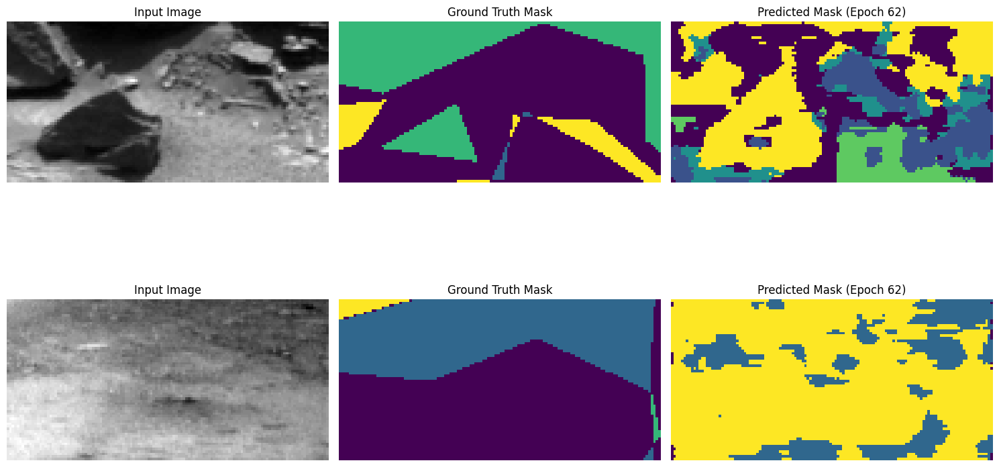

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - accuracy: 0.5417 - loss: 0.0067 - mean_io_u_1: 0.3072 - val_accuracy: 0.5566 - val_loss: 0.0061 - val_mean_io_u_1: 0.3033 - learning_rate: 1.5625e-05
Epoch 63/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5417 - loss: 0.0067 - mean_io_u_1: 0.3072
Epoch 63: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras

Epoch 63: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


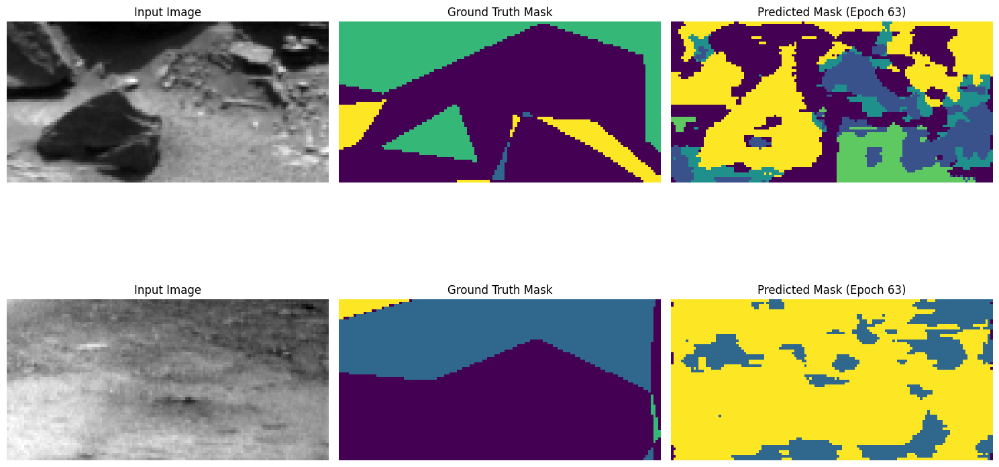

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.5419 - loss: 0.0067 - mean_io_u_1: 0.3074 - val_accuracy: 0.5568 - val_loss: 0.0061 - val_mean_io_u_1: 0.3034 - learning_rate: 1.5625e-05
Epoch 64/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5415 - loss: 0.0067 - mean_io_u_1: 0.3068
Epoch 64: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


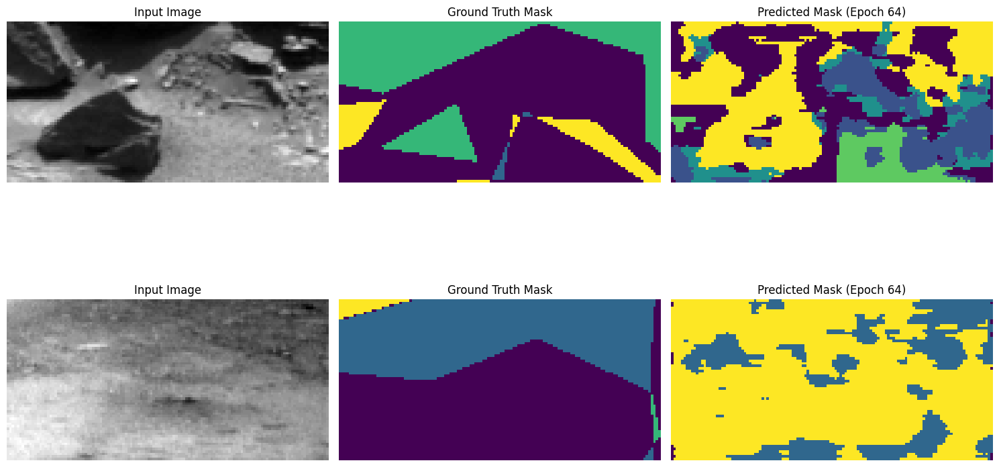

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.5417 - loss: 0.0067 - mean_io_u_1: 0.3070 - val_accuracy: 0.5580 - val_loss: 0.0061 - val_mean_io_u_1: 0.3049 - learning_rate: 7.8125e-06
Epoch 65/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5421 - loss: 0.0067 - mean_io_u_1: 0.3076
Epoch 65: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


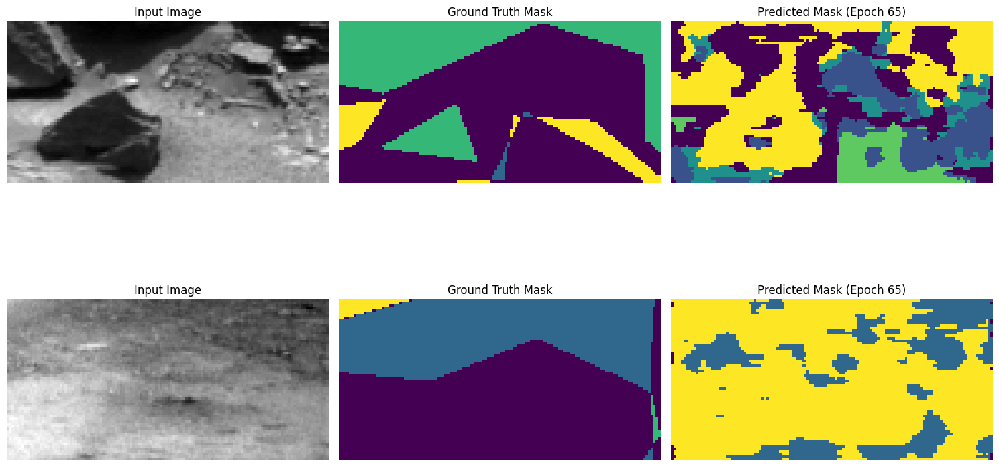

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.5423 - loss: 0.0067 - mean_io_u_1: 0.3077 - val_accuracy: 0.5581 - val_loss: 0.0061 - val_mean_io_u_1: 0.3049 - learning_rate: 7.8125e-06
Epoch 66/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5423 - loss: 0.0067 - mean_io_u_1: 0.3077
Epoch 66: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


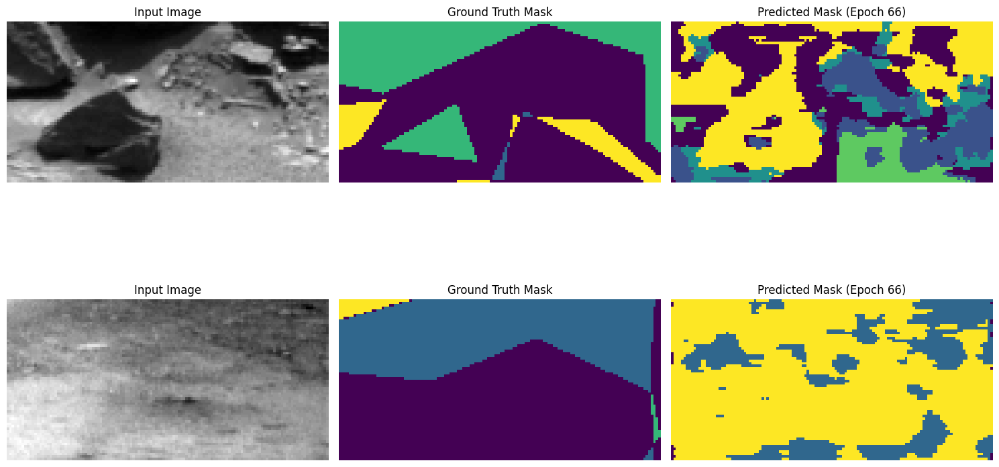

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - accuracy: 0.5425 - loss: 0.0067 - mean_io_u_1: 0.3078 - val_accuracy: 0.5582 - val_loss: 0.0061 - val_mean_io_u_1: 0.3049 - learning_rate: 7.8125e-06
Epoch 67/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.5424 - loss: 0.0067 - mean_io_u_1: 0.3078
Epoch 67: val_loss improved from 0.00615 to 0.00615, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


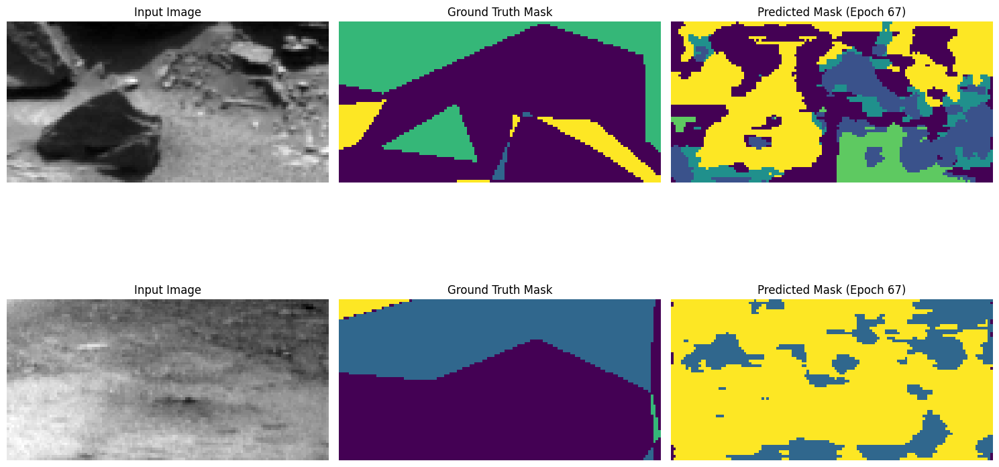

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - accuracy: 0.5426 - loss: 0.0067 - mean_io_u_1: 0.3079 - val_accuracy: 0.5583 - val_loss: 0.0061 - val_mean_io_u_1: 0.3050 - learning_rate: 7.8125e-06
Epoch 68/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.5425 - loss: 0.0067 - mean_io_u_1: 0.3078
Epoch 68: val_loss improved from 0.00615 to 0.00614, saving model to best_model.keras

Epoch 68: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


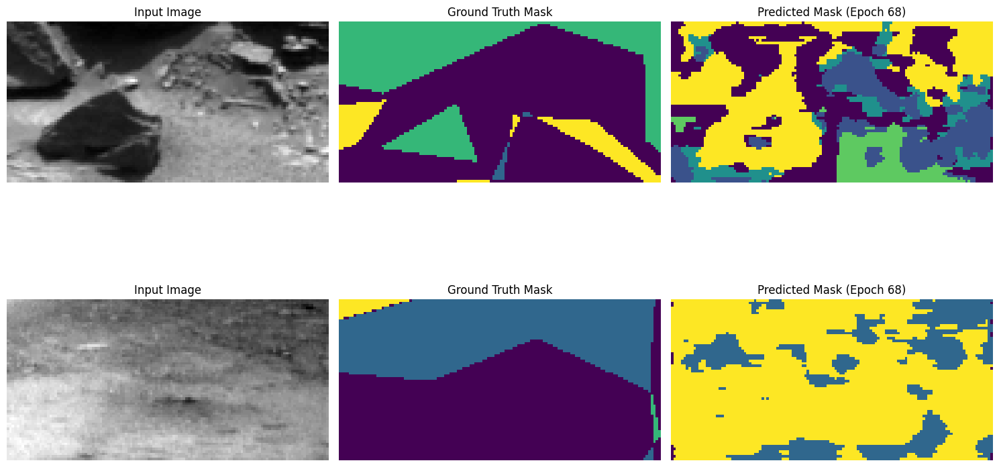

71/71 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.5427 - loss: 0.0067 - mean_io_u_1: 0.3079 - val_accuracy: 0.5583 - val_loss: 0.0061 - val_mean_io_u_1: 0.3050 - learning_rate: 7.8125e-06
Epoch 69/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.5425 - loss: 0.0067 - mean_io_u_1: 0.3076
Epoch 69: val_loss improved from 0.00614 to 0.00614, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


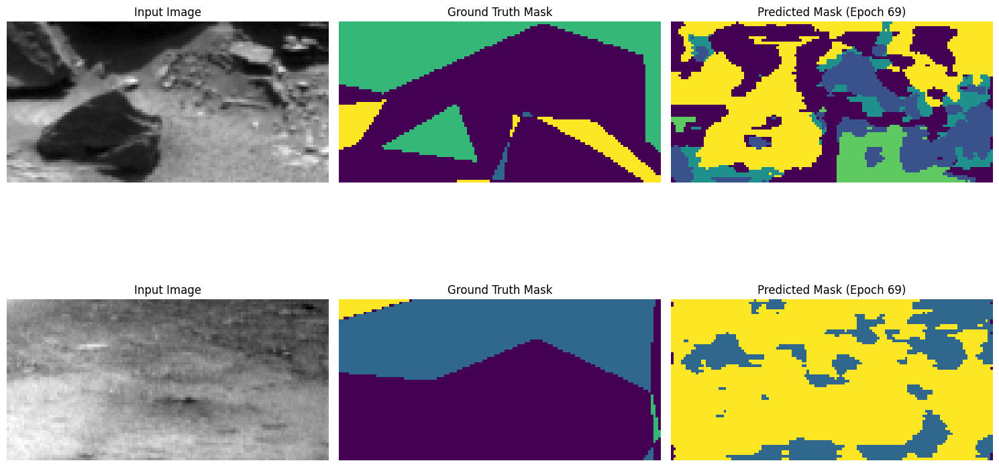

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.5427 - loss: 0.0067 - mean_io_u_1: 0.3078 - val_accuracy: 0.5587 - val_loss: 0.0061 - val_mean_io_u_1: 0.3055 - learning_rate: 3.9063e-06
Epoch 70/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5428 - loss: 0.0067 - mean_io_u_1: 0.3080
Epoch 70: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


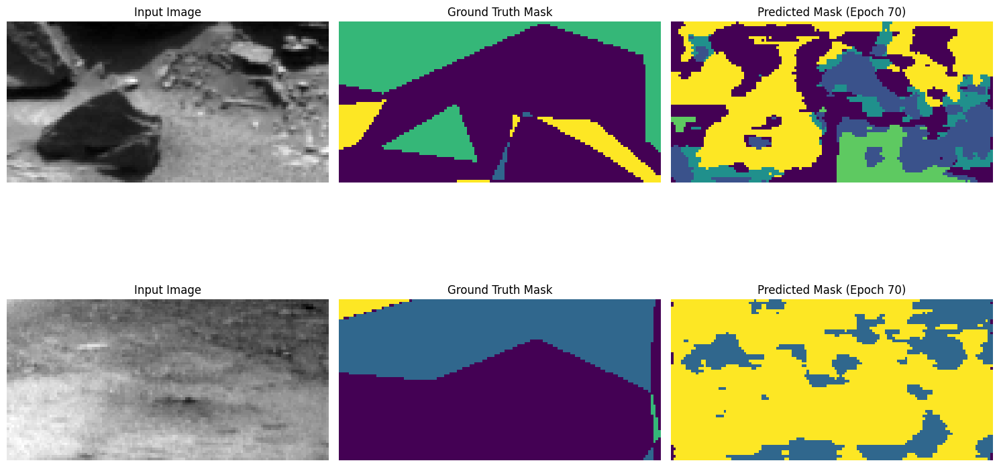

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 0.5430 - loss: 0.0067 - mean_io_u_1: 0.3082 - val_accuracy: 0.5589 - val_loss: 0.0061 - val_mean_io_u_1: 0.3056 - learning_rate: 3.9063e-06
Epoch 71/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5429 - loss: 0.0067 - mean_io_u_1: 0.3081
Epoch 71: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


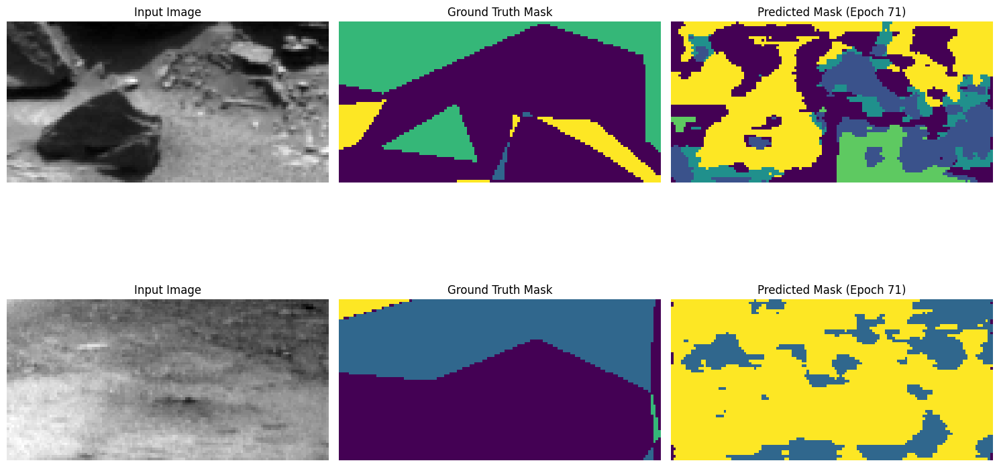

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.5431 - loss: 0.0067 - mean_io_u_1: 0.3083 - val_accuracy: 0.5589 - val_loss: 0.0061 - val_mean_io_u_1: 0.3056 - learning_rate: 3.9063e-06
Epoch 72/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5429 - loss: 0.0067 - mean_io_u_1: 0.3082
Epoch 72: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


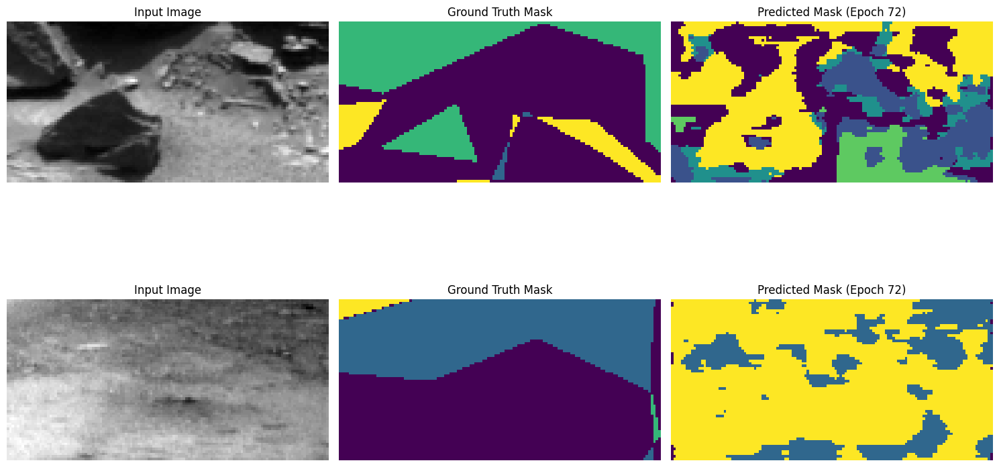

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 104ms/step - accuracy: 0.5431 - loss: 0.0067 - mean_io_u_1: 0.3083 - val_accuracy: 0.5589 - val_loss: 0.0061 - val_mean_io_u_1: 0.3056 - learning_rate: 3.9063e-06
Epoch 73/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5430 - loss: 0.0067 - mean_io_u_1: 0.3082
Epoch 73: val_loss did not improve from 0.00614

Epoch 73: ReduceLROnPlateau reducing learning rate to 1.9531250927684596e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


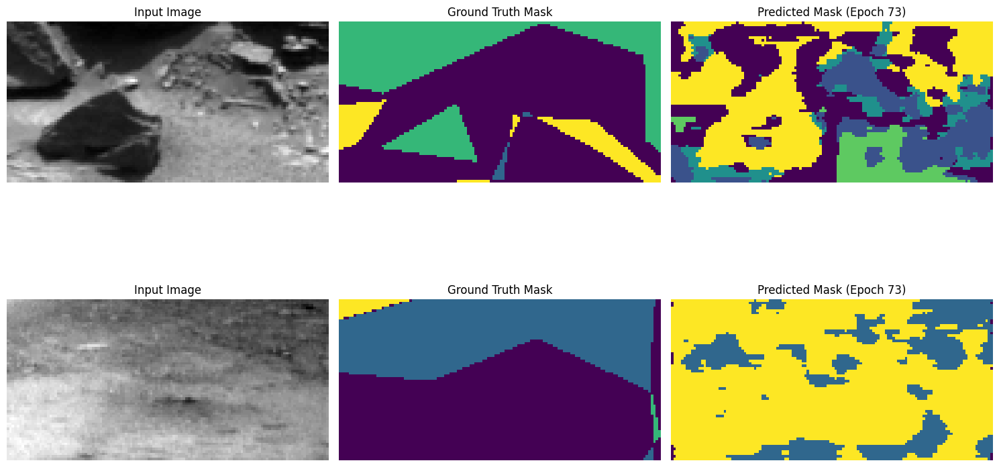

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.5432 - loss: 0.0067 - mean_io_u_1: 0.3083 - val_accuracy: 0.5590 - val_loss: 0.0061 - val_mean_io_u_1: 0.3056 - learning_rate: 3.9063e-06
Epoch 74/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5430 - loss: 0.0067 - mean_io_u_1: 0.3081
Epoch 74: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


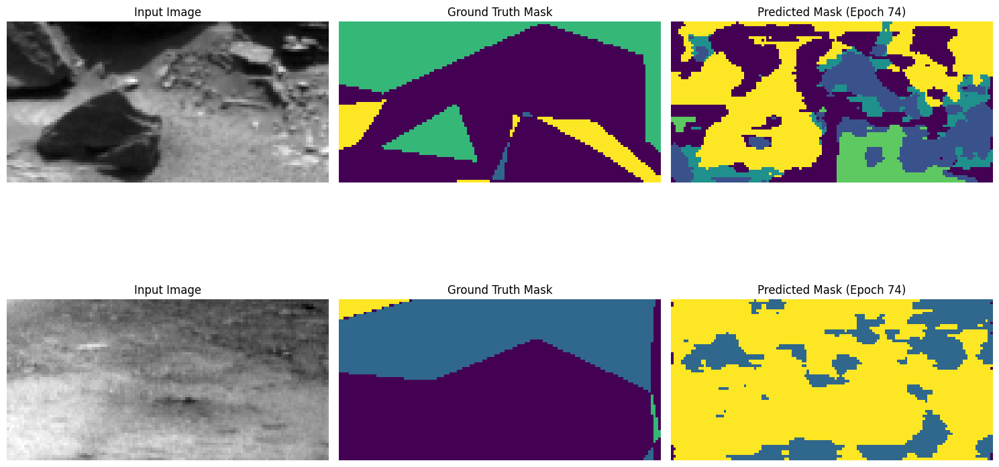

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.5432 - loss: 0.0067 - mean_io_u_1: 0.3083 - val_accuracy: 0.5591 - val_loss: 0.0061 - val_mean_io_u_1: 0.3058 - learning_rate: 1.9531e-06
Epoch 75/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5431 - loss: 0.0067 - mean_io_u_1: 0.3083
Epoch 75: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


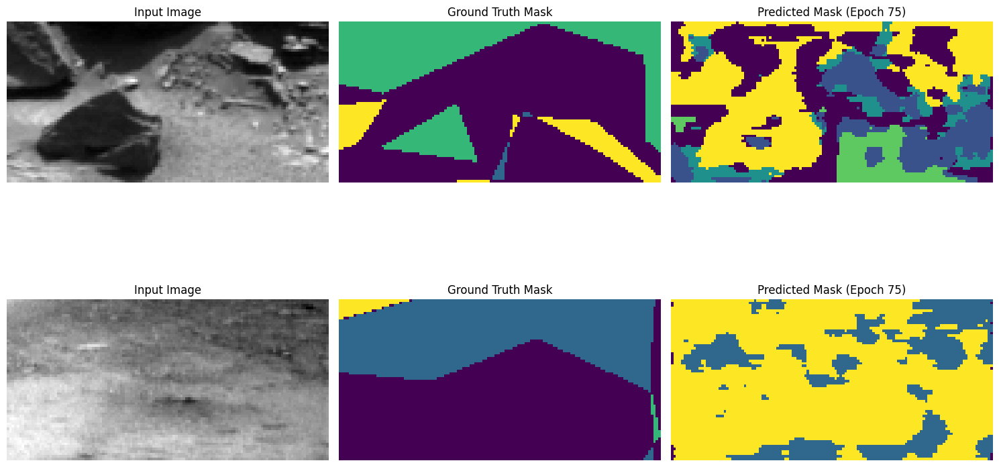

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.5433 - loss: 0.0067 - mean_io_u_1: 0.3084 - val_accuracy: 0.5592 - val_loss: 0.0061 - val_mean_io_u_1: 0.3059 - learning_rate: 1.9531e-06
Epoch 76/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5432 - loss: 0.0067 - mean_io_u_1: 0.3083
Epoch 76: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


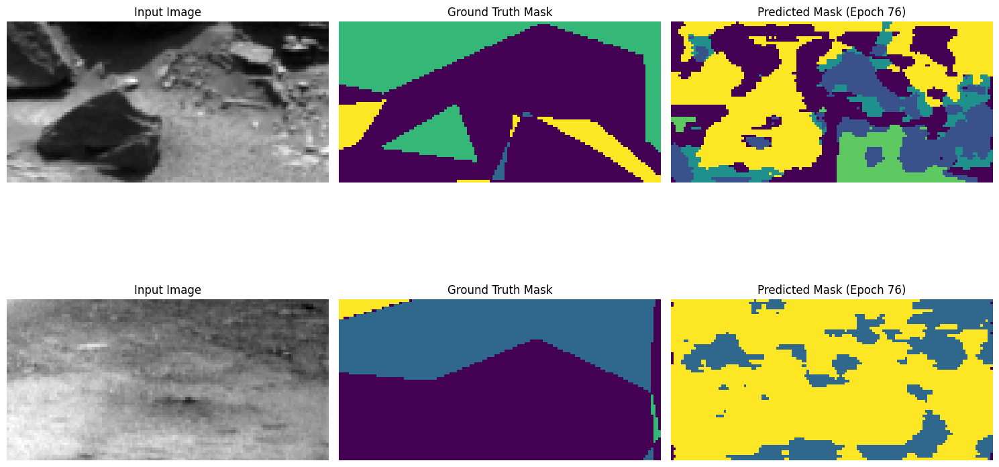

71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - accuracy: 0.5434 - loss: 0.0067 - mean_io_u_1: 0.3085 - val_accuracy: 0.5592 - val_loss: 0.0061 - val_mean_io_u_1: 0.3059 - learning_rate: 1.9531e-06
Epoch 77/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.5432 - loss: 0.0067 - mean_io_u_1: 0.3084
Epoch 77: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


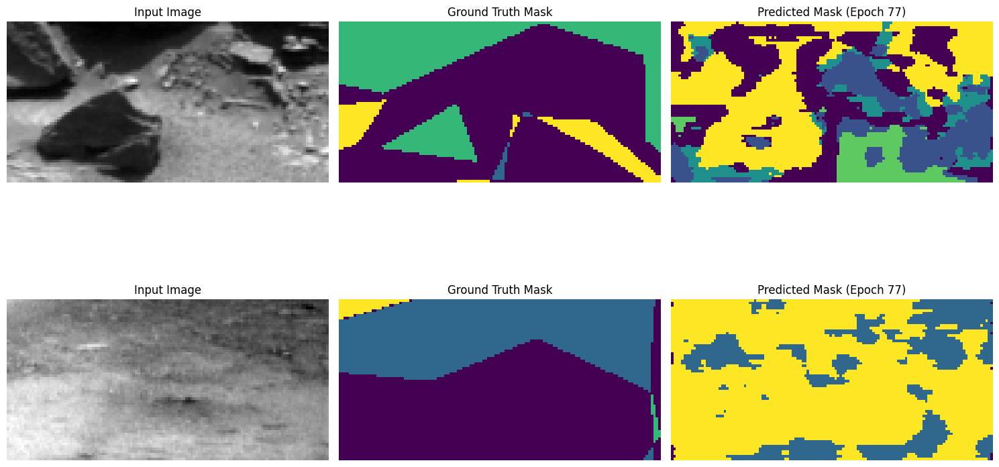

71/71 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - accuracy: 0.5434 - loss: 0.0067 - mean_io_u_1: 0.3085 - val_accuracy: 0.5593 - val_loss: 0.0061 - val_mean_io_u_1: 0.3059 - learning_rate: 1.9531e-06
Epoch 78/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5433 - loss: 0.0067 - mean_io_u_1: 0.3084
Epoch 78: val_loss did not improve from 0.00614

Epoch 78: ReduceLROnPlateau reducing learning rate to 1e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


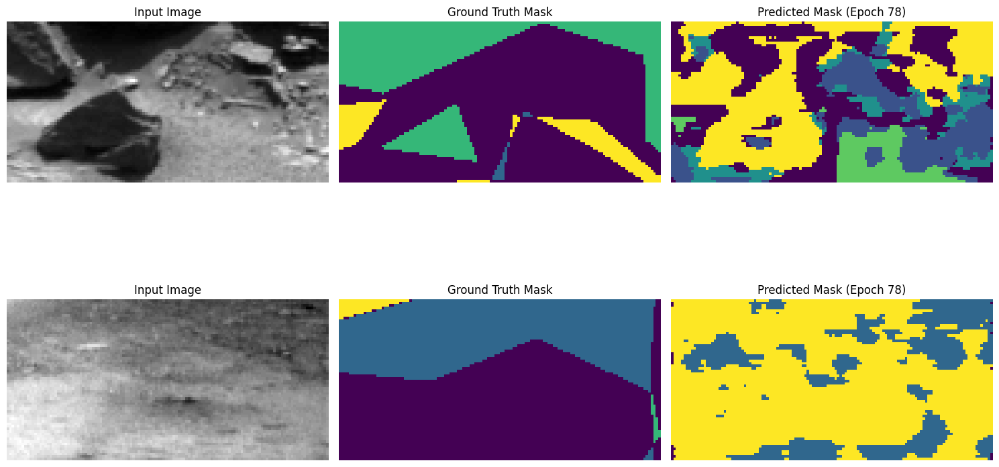

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.5435 - loss: 0.0067 - mean_io_u_1: 0.3085 - val_accuracy: 0.5593 - val_loss: 0.0061 - val_mean_io_u_1: 0.3059 - learning_rate: 1.9531e-06
Epoch 79/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5433 - loss: 0.0067 - mean_io_u_1: 0.3084
Epoch 79: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


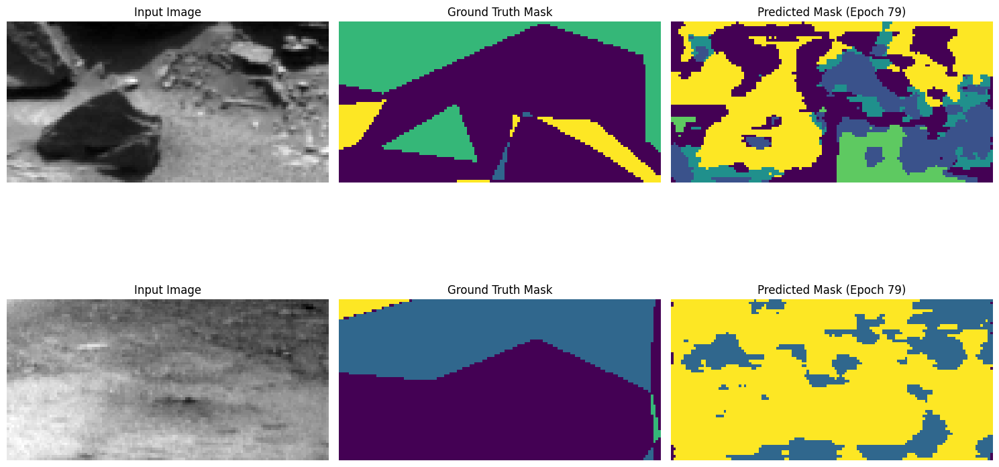

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - accuracy: 0.5435 - loss: 0.0067 - mean_io_u_1: 0.3085 - val_accuracy: 0.5593 - val_loss: 0.0061 - val_mean_io_u_1: 0.3060 - learning_rate: 1.0000e-06
Epoch 80/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.5433 - loss: 0.0067 - mean_io_u_1: 0.3084
Epoch 80: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


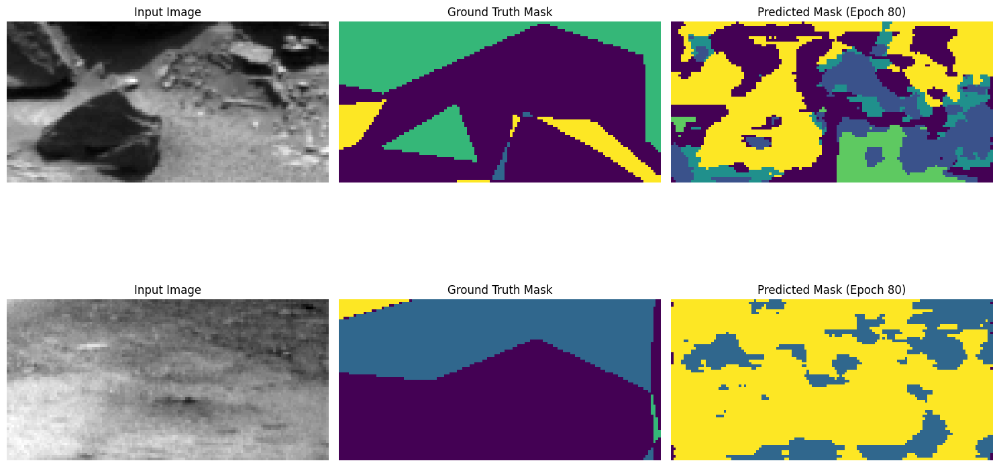

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.5435 - loss: 0.0067 - mean_io_u_1: 0.3085 - val_accuracy: 0.5593 - val_loss: 0.0061 - val_mean_io_u_1: 0.3060 - learning_rate: 1.0000e-06
Epoch 81/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.5433 - loss: 0.0067 - mean_io_u_1: 0.3084
Epoch 81: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


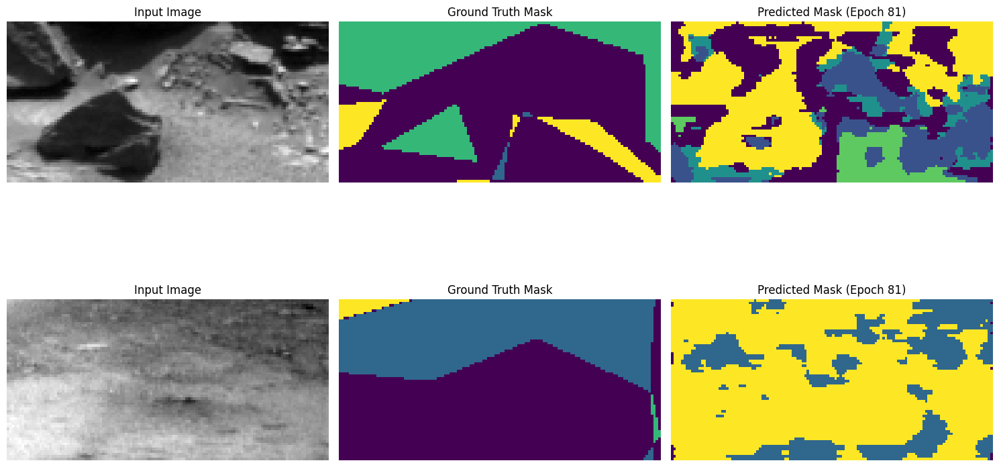

71/71 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - accuracy: 0.5435 - loss: 0.0067 - mean_io_u_1: 0.3086 - val_accuracy: 0.5593 - val_loss: 0.0061 - val_mean_io_u_1: 0.3060 - learning_rate: 1.0000e-06
Epoch 82/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5434 - loss: 0.0067 - mean_io_u_1: 0.3085
Epoch 82: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


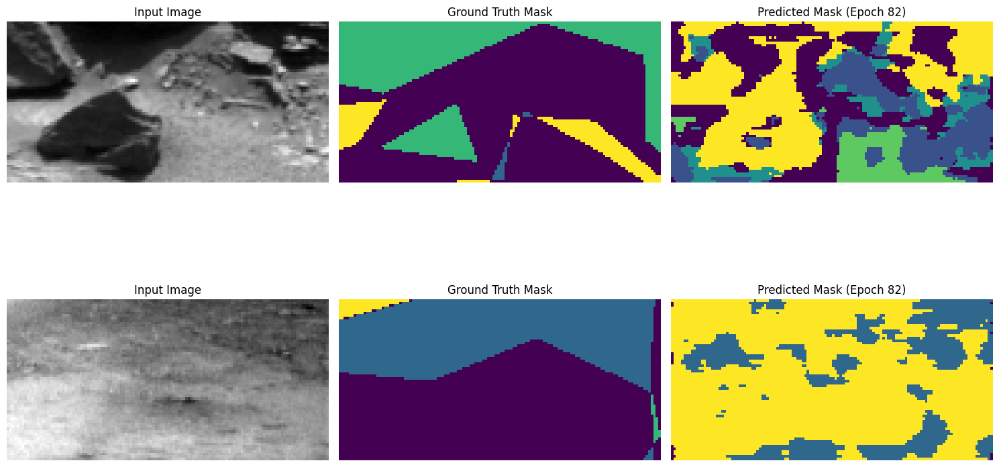

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - accuracy: 0.5436 - loss: 0.0067 - mean_io_u_1: 0.3086 - val_accuracy: 0.5594 - val_loss: 0.0061 - val_mean_io_u_1: 0.3060 - learning_rate: 1.0000e-06
Epoch 83/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5434 - loss: 0.0067 - mean_io_u_1: 0.3085
Epoch 83: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


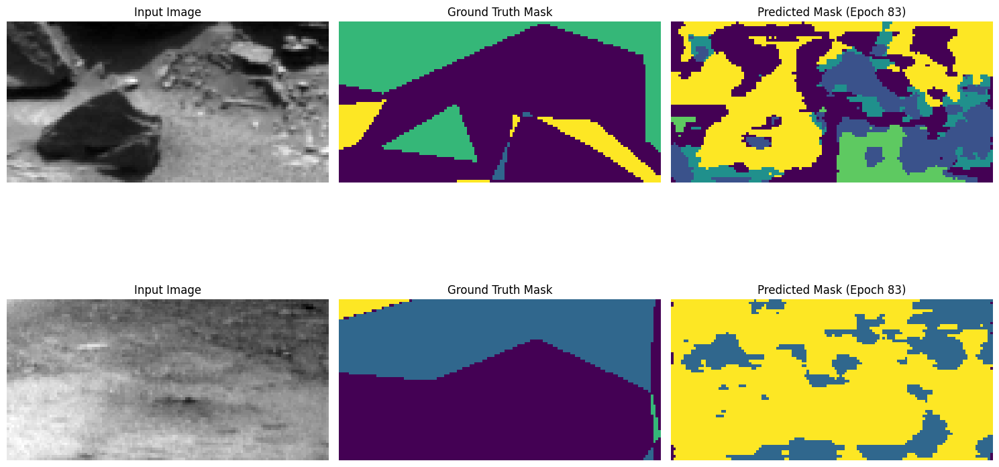

71/71 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 0.5436 - loss: 0.0067 - mean_io_u_1: 0.3086 - val_accuracy: 0.5594 - val_loss: 0.0061 - val_mean_io_u_1: 0.3060 - learning_rate: 1.0000e-06
Epoch 84/1000
70/71 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5434 - loss: 0.0067 - mean_io_u_1: 0.3085
Epoch 84: val_loss did not improve from 0.00614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


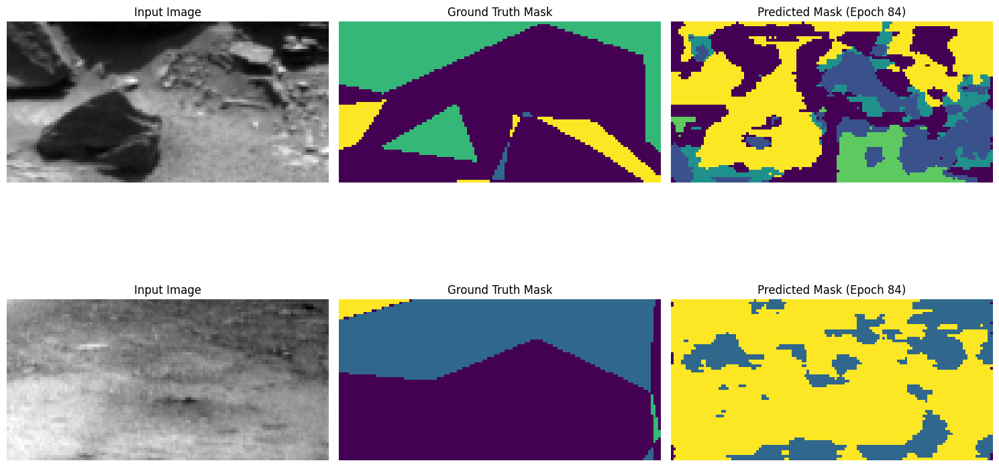

71/71 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.5436 - loss: 0.0067 - mean_io_u_1: 0.3086 - val_accuracy: 0.5594 - val_loss: 0.0061 - val_mean_io_u_1: 0.3061 - learning_rate: 1.0000e-06


NameError: name 'checkpoint_filepath' is not defined

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Remove any unnecessary singleton dimensions and ensure the shape is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape
# Remove unnecessary reshaping of y_train

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Weighted Loss Function for Class Imbalance
def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(weights))
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        return -tf.reduce_sum(y_true * tf.math.log(y_pred) * weights, axis=-1)

    return loss

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Use the calculated weights in the loss function
loss = weighted_categorical_crossentropy(class_weights)

# Define the U-Net Model
def unet_model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(input_shape)

    # Encoder
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(inputs)
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding="same")(p1)
    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding="same")(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    # Decoder
    u1 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding="same")(c2)
    u1 = tf.keras.layers.concatenate([u1, c1])
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(u1)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c3)

    outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation="softmax")(c3)
    return tf.keras.Model(inputs, outputs)

# Initialize the model
input_shape = X_train.shape[1:]
model = unet_model(input_shape, num_classes)

# Define the MeanIoU metric (ignore background class 0)
mean_iou = tf.keras.metrics.MeanIoU(num_classes=num_classes, ignore_class=0, sparse_y_pred=False)

# Compile the model with loss and metrics
model.compile(optimizer="adam", loss=loss, metrics=["accuracy", mean_iou])

model.summary()

# Callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=15,
    restore_best_weights=True
)

model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

visualize_callback = VisualizeSegmentationCallback(X_train, y_train, num_images=2)

# Training
history = model.fit(
    X_train,  # Use X_train directly
    y_train,  # Use y_train directly
    batch_size=32,
    epochs=1000,
    validation_split=0.1,
    callbacks=[early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)

In [57]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.saving import register_keras_serializable

# Register the custom loss function as a Keras serializable object
@register_keras_serializable()
def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(weights))
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        return -tf.reduce_sum(y_true * tf.math.log(y_pred) * weights, axis=-1)

    return loss

# Assuming class_weights were previously calculated and saved
# If not, you need to recalculate them before loading the model.
# For example:
# class_weights = [0.1, 0.4, 0.2, 0.3] # Replace with your actual weights

# Create an instance of the loss function with your weights
# and pass it to custom_objects
loss_function = weighted_categorical_crossentropy(class_weights) # Assuming class_weights are defined


# Load the model with the custom loss function instance
model = load_model("model_unet.keras", custom_objects={"weighted_categorical_crossentropy": weighted_categorical_crossentropy, "loss": loss_function})

# Check the model summary to verify it's loaded correctly
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 64, 128, 1)     │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 128, 64)    │            640 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 64, 128, 64)    │         36,928 │ conv2d_22[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 32, 64, 64)     │              0 │ conv2d_23[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 32, 64, 128)    │         73,856 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 32, 64, 128)    │        147,584 │ conv2d_24[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_3        │ (None, 64, 128, 64)    │         32,832 │ conv2d_25[0][0]        │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 64, 128, 128)   │              0 │ conv2d_transpose_3[0]… │
│ (Concatenate)             │                        │                │ conv2d_23[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_26 (Conv2D)        │ (None, 64, 128, 64)    │         73,792 │ concatenate_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_27 (Conv2D)        │ (None, 64, 128, 64)    │         36,928 │ conv2d_26[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 64, 128, 5)     │            325 │ conv2d_27[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,208,657 (4.61 MB)

 Trainable params: 402,885 (1.54 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 805,772 (3.07 MB)

In [53]:
timestep_str = datetime.now().strftime("%y%m%d_%H%M%S")
model_filename = f"model_unet.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_unet.keras


## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.




In [58]:
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [59]:
print(f"X_test shape before reshaping: {X_test.shape}")


X_test shape before reshaping: (10022, 64, 128, 1)


In [60]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")


314/314 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step
Predictions shape: (10022, 64, 128)


Randomly selected indices for prediction (seed=42): [1836  252 2173  430 1357 1621 1891 1071  239 1313 2222  354  445 2032
   93 1213 1407 2337 1242  782]
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


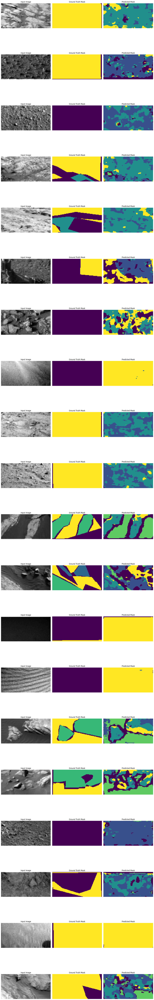

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)

# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_train.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_train[random_indices]
y_sample = y_train[random_indices]

# Predict on the selected samples
predictions = model.predict(X_sample)
predicted_masks = np.argmax(predictions, axis=-1)  # Convert predictions to class labels

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 3, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Ground Truth Mask
    ax_gt = axes[i, 1]
    ax_gt.imshow(y_sample[i], cmap="viridis")
    ax_gt.set_title("Ground Truth Mask")
    ax_gt.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 2]
    ax_pred.imshow(predicted_masks[i], cmap="viridis")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()


In [63]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [64]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)

from google.colab import files
files.download(submission_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#  
<img src="https://airlab.deib.polimi.it/wp-content/uploads/2019/07/airlab-logo-new_cropped.png" width="350">

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/95/Instagram_logo_2022.svg/800px-Instagram_logo_2022.svg.png" width="15"> **Instagram:** https://www.instagram.com/airlab_polimi/

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/LinkedIn_icon.svg/2048px-LinkedIn_icon.svg.png" width="15"> **LinkedIn:** https://www.linkedin.com/company/airlab-polimi/
___
Credits: Alberto Archetti 📧 alberto.archetti@polito.it





```
   Copyright 2024 Alberto Archetti

   Licensed under the Apache License, Version 2.0 (the "License");
   you may not use this file except in compliance with the License.
   You may obtain a copy of the License at

       http://www.apache.org/licenses/LICENSE-2.0

   Unless required by applicable law or agreed to in writing, software
   distributed under the License is distributed on an "AS IS" BASIS,
   WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
   See the License for the specific language governing permissions and
   limitations under the License.
```